In [1]:
import os
from scipy.io import loadmat
import matplotlib.pyplot as plt
from astropy.io import fits
import imageio
import numpy as np
import scipy
from scipy import linalg
import imageio.v2 as imageio
from imageio.core import util as imageio_util
import matplotlib.cm as cm

folder = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results'

# Calibration

## Valid pixels mask

valid_pix_mask shape: (127, 160)
valid pixels: 2737


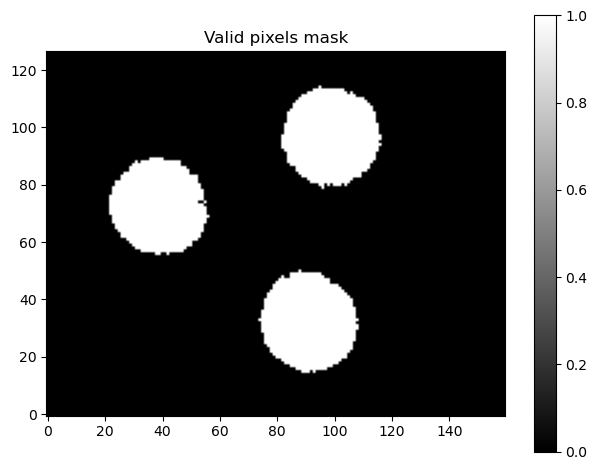

In [2]:
# Load mask
mask_path = os.path.join(
    folder,
    'AObench/outputs/Calibration_files_papyrus_best/mask_3s_pyr_08_08_25.fits'
)
with fits.open(mask_path) as hdul:
    mask = hdul[0].data

print("valid_pix_mask shape:", mask.shape)

valid_pixels_indices = np.where(mask > 0)
npix_valid = valid_pixels_indices[0].shape[0]
print("valid pixels:", npix_valid)

# Save a visualization (PNG)
plt.figure()
plt.title('Valid pixels mask')
plt.imshow(mask, cmap='gray', origin='lower')
plt.colorbar()
plt.tight_layout()
mask_png = os.path.join('AObench/outputs/Calibration_files_papyrus_best', 'valid_pixels_mask.png')
plt.savefig(mask_png, dpi=300)
plt.show()

## Reference Image

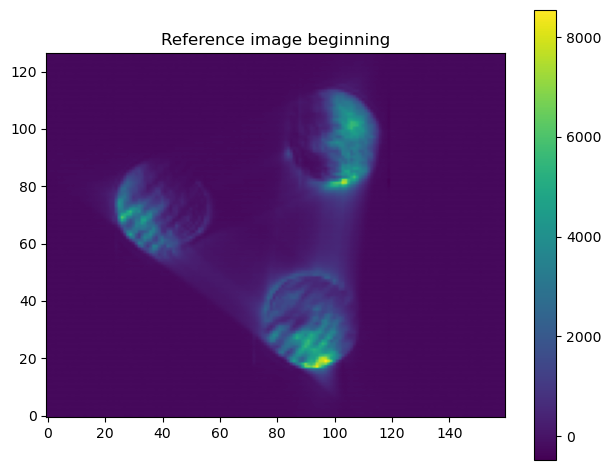

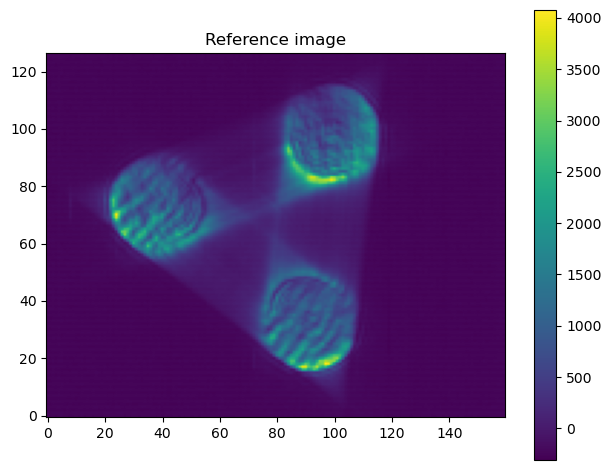

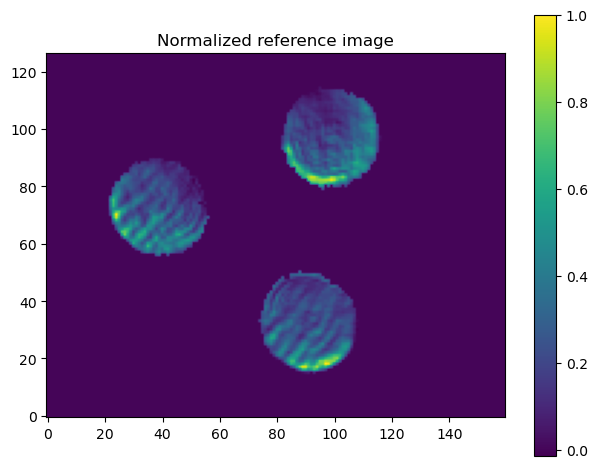

Saved plots:
- AObench/outputs/Calibration_files_papyrus_best/reference_image.png
- AObench/outputs/Calibration_files_papyrus_best/normalized_reference_image.png


In [3]:
# Paths
ref_start_path = os.path.join(folder, 'AObench/outputs/Calibration_files_papyrus_08_08_25/reference_image_raw_20250808_233634.fits')
ref_path = os.path.join(folder, 'AObench/outputs/Calibration_files_papyrus_best/reference_image_raw_08_08_25.fits')
bias_path = os.path.join(folder, 'AObench/outputs/Calibration_files_papyrus_best/bias_image_ref.fits')

# Load as float for arithmetic
reference_image_start_wb = fits.getdata(ref_start_path).astype(np.float32)
reference_image_wb = fits.getdata(ref_path).astype(np.float32)
ref_img_bias    = fits.getdata(bias_path).astype(np.float32)

# Bias subtraction
reference_image_start = reference_image_start_wb - ref_img_bias
reference_image = reference_image_wb - ref_img_bias

# --- Save refrence image start---
plt.figure()
plt.title('Reference image beginning')
plt.imshow(reference_image_start, origin='lower')
plt.colorbar()
plt.tight_layout()
ref_png = os.path.join('AObench/outputs/Calibration_files_papyrus_best', 'reference_image_start.png')
plt.savefig(ref_png, dpi=300)
plt.show()

# --- Save refrence image ---
plt.figure()
plt.title('Reference image')
plt.imshow(reference_image, origin='lower')
plt.colorbar()
plt.tight_layout()
ref_png = os.path.join('AObench/outputs/Calibration_files_papyrus_best', 'reference_image.png')
plt.savefig(ref_png, dpi=300)
plt.show()

# Apply mask and normalize (no branching)
masked_image = reference_image * mask
denom = np.maximum(np.max(masked_image), np.finfo(np.float32).eps)
normalized_reference_image = masked_image / denom

# --- Save normalized image plot ---
plt.figure()
plt.title('Normalized reference image')
plt.imshow(normalized_reference_image, origin='lower')
plt.colorbar()
plt.tight_layout()
norm_png = os.path.join('AObench/outputs/Calibration_files_papyrus_best', 'normalized_reference_image.png')
plt.savefig(norm_png, dpi=300)
plt.show()

print(f"Saved plots:\n- {ref_png}\n- {norm_png}")


## KL2C matrix

KL2C shape: (241, 195)


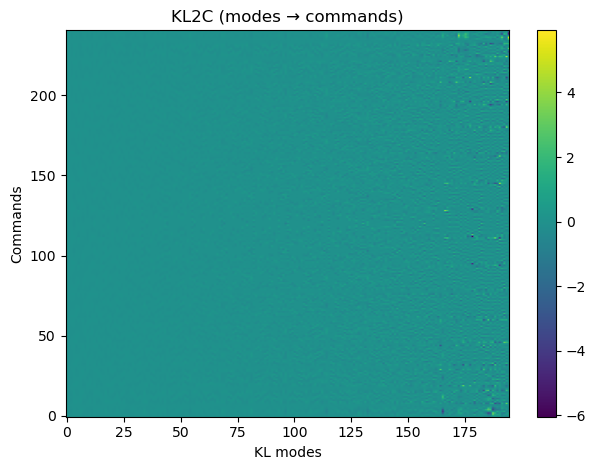

C2KL shape: (195, 241)


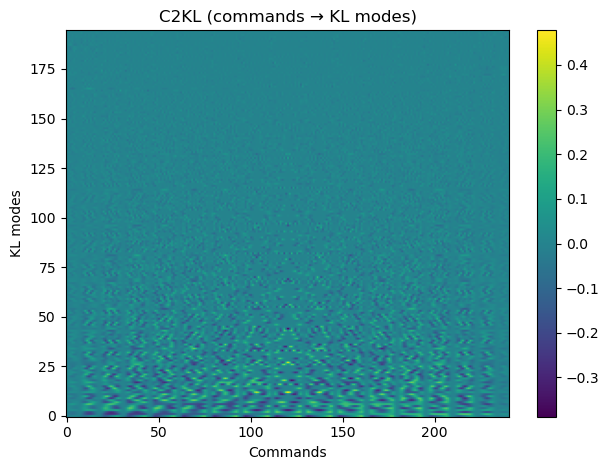

In [4]:
# Load KL2C (aka M2V) from FITS
kl2c_path = os.path.join(folder, 'AObench/outputs/Calibration_files_papyrus_best/M2V.fits')
KL2C = fits.getdata(kl2c_path).astype(np.float64)

print("KL2C shape:", KL2C.shape)

plt.figure()
plt.imshow(KL2C, aspect='auto', origin='lower')
plt.colorbar()
plt.title('KL2C (modes → commands)')
plt.xlabel('KL modes')
plt.ylabel('Commands')
plt.tight_layout()
plt.show()

# Unit scale for DM
DM_unit = 7.591  # µm

# Pseudoinverse: Commands → KL modes
C2KL = linalg.pinv(KL2C)           # base pseudoinverse
# C2KL = linalg.pinv(KL2C) * DM_unit  # µm-scaled mapping

print("C2KL shape:", C2KL.shape)

plt.figure()
plt.imshow(C2KL, aspect='auto', origin='lower')
plt.colorbar()
plt.title('C2KL (commands → KL modes)')
plt.xlabel('Commands')
plt.ylabel('KL modes')
plt.tight_layout()
plt.show()


## Push-Pull Cube

Cube shape: (195, 127, 160) dtype: >f4


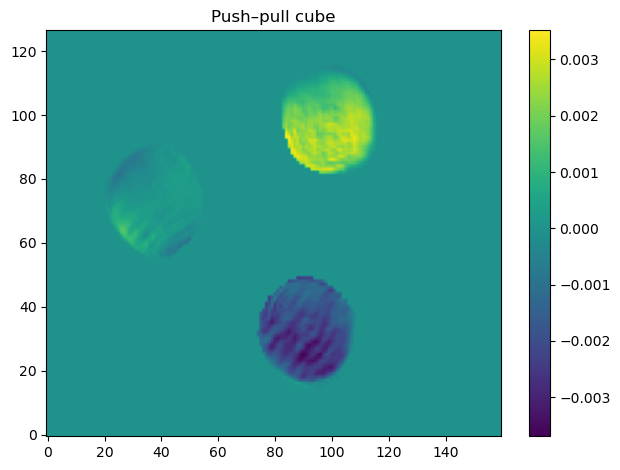

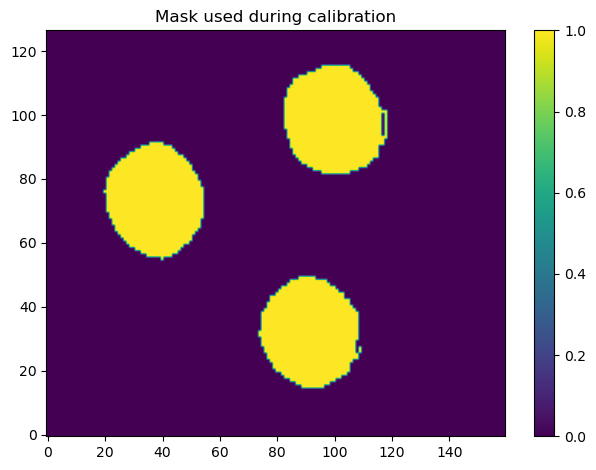

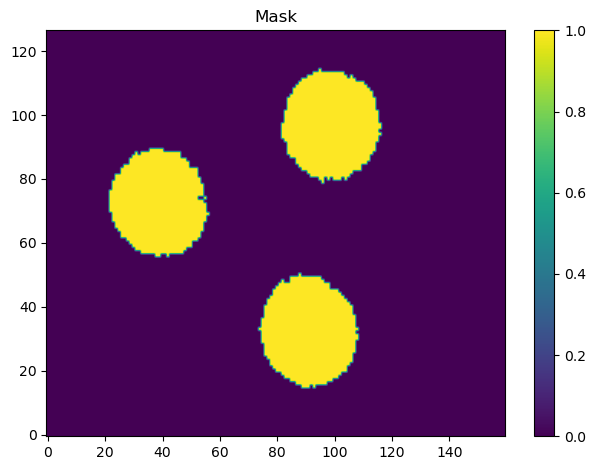

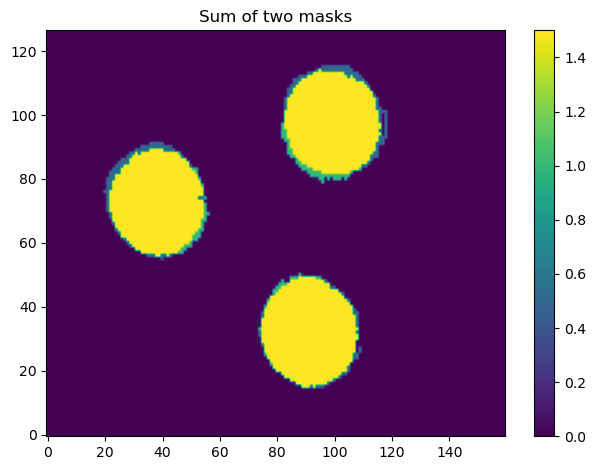

'\n# --- Fix colorbar range across all frames ---\nvmin = - 0.008 #float(np.nanmin(cube))\nvmax = 0.008 #float(np.nanmax(cube))\n\n# --- Render each frame with fixed colorbar and collect RGB images ---\nframes_rgb = []\nfor i in range(cube.shape[0]):\n    fig, ax = plt.subplots(figsize=(6, 4), dpi=150)\n    im = ax.imshow(cube[i], origin=\'lower\', aspect=\'auto\', vmin=vmin, vmax=vmax)\n    cbar = fig.colorbar(im, ax=ax)\n    ax.set_title(f\'Push–pull frame {i}\')\n    fig.tight_layout()\n\n    fig.canvas.draw()\n    w, h = fig.canvas.get_width_height()\n    rgb = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8).reshape(h, w, 3)\n    frames_rgb.append(rgb)\n    plt.close(fig)\n\n# --- Save GIF from RGB frames (no warnings about float→uint8) ---\ngif_path = os.path.join(\'AObench/outputs/Calibration_files_papyrus_best/\', \'push_pull_images.gif\')\nfps = 8\nimageio.mimsave(gif_path, frames_rgb, duration=1.0 / fps, loop=0)\nprint(f"Saved GIF: {gif_path}")\n'

In [5]:
#Push-Pull images
cube_path = os.path.join(
    folder,
    'AObench/outputs/Calibration_files_papyrus_best/processed_response_cube_KL2PWFS_push-pull_nact_17_amp_0.15_3s_pyr.fits')

cube = fits.getdata(cube_path, memmap=True)
print("Cube shape:", cube.shape, "dtype:", cube.dtype)

mask_new = np.zeros_like(cube[0,:,:])
mask_new[cube[0,:,:]!=0] = 1

%matplotlib inline
plt.figure()
plt.title('Push–pull cube')
plt.imshow(cube[0,:,:] , origin='lower', aspect='auto')
plt.colorbar()
plt.tight_layout()
plt.show()

# First figure
plt.figure()
plt.title('Mask used during calibration')
plt.imshow(mask_new, origin='lower', aspect='auto')
plt.colorbar()
plt.tight_layout()
plt.savefig(os.path.join('AObench/outputs/Calibration_files_papyrus_best',"mask_used_during_calibration.png"), dpi=300)
plt.show()

# Second figure
plt.figure()
plt.title('Mask')
plt.imshow(mask, origin='lower', aspect='auto')
plt.colorbar()
plt.tight_layout()
plt.savefig(os.path.join('AObench/outputs/Calibration_files_papyrus_best',"mask.png"), dpi=300)
plt.show()

# Third figure
plt.figure()
plt.title('Sum of two masks')
plt.imshow(mask + 0.5 * mask_new, origin='lower', aspect='auto')
plt.colorbar()
plt.tight_layout()
plt.savefig(os.path.join('AObench/outputs/Calibration_files_papyrus_best',"sum_of_two_masks.png"), dpi=300)
plt.show()



"""
# --- Fix colorbar range across all frames ---
vmin = - 0.008 #float(np.nanmin(cube))
vmax = 0.008 #float(np.nanmax(cube))

# --- Render each frame with fixed colorbar and collect RGB images ---
frames_rgb = []
for i in range(cube.shape[0]):
    fig, ax = plt.subplots(figsize=(6, 4), dpi=150)
    im = ax.imshow(cube[i], origin='lower', aspect='auto', vmin=vmin, vmax=vmax)
    cbar = fig.colorbar(im, ax=ax)
    ax.set_title(f'Push–pull frame {i}')
    fig.tight_layout()

    fig.canvas.draw()
    w, h = fig.canvas.get_width_height()
    rgb = np.frombuffer(fig.canvas.tostring_rgb(), dtype=np.uint8).reshape(h, w, 3)
    frames_rgb.append(rgb)
    plt.close(fig)

# --- Save GIF from RGB frames (no warnings about float→uint8) ---
gif_path = os.path.join('AObench/outputs/Calibration_files_papyrus_best/', 'push_pull_images.gif')
fps = 8
imageio.mimsave(gif_path, frames_rgb, duration=1.0 / fps, loop=0)
print(f"Saved GIF: {gif_path}")
"""

## Intreaction Matrix

In [6]:
def compute_response_matrix(images, mask=None):
    """
    Compute a response matrix from a 3D array, list of 2D images, or 2D array of flattened images.

    Parameters:
    -----------
    images : np.ndarray or list
        - 3D array (n_images, height, width)
        - List of 2D images
        - 2D array (n_images, n_pixels), where each row is a flattened image
    mask : np.ndarray or None
        Optional 2D mask to apply to each image. Only pixels where mask > 0 are kept.

    Returns:
    --------
    response_matrix : np.ndarray
        2D array where each row is a flattened image (masked or full).
    """
    images = np.asarray(images)

    # If input is 2D, assume each row is a flattened image
    if images.ndim == 2:
        n_images, n_pixels = images.shape
        side = int(np.sqrt(n_pixels))
        if side * side != n_pixels:
            raise ValueError(f"Cannot reshape image: {n_pixels} pixels is not a perfect square.")
        images = images.reshape((n_images, side, side))

    # If input is a single 2D image, make it 3D
    elif images.ndim == 2:
        images = images[np.newaxis, ...]

    if images.ndim != 3:
        raise ValueError("Input must be a 2D or 3D array of images.")

    if mask is not None:
        mask = np.asarray(mask)
        if mask.shape != images.shape[1:]:
            raise ValueError("Mask shape must match individual image shape.")
        response_matrix = np.array([img[mask > 0].ravel() for img in images])
    else:
        response_matrix = images.reshape(images.shape[0], -1)

    return response_matrix



KL2S shape: (195, 2737)


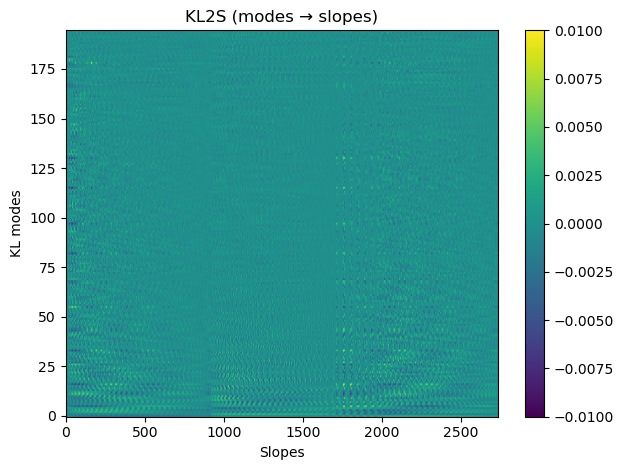

Shape of the reconstruction matrix: (2737, 195)


In [7]:
kl2s_3D_path = os.path.join(folder, 'AObench/outputs/Calibration_files_papyrus_best/processed_response_cube_KL2PWFS_push-pull_nact_17_amp_0.15_3s_pyr.fits')
KL2S_3D = fits.getdata(kl2s_3D_path)

IM_KL2S = compute_response_matrix(KL2S_3D, mask).astype(np.float32)

print("KL2S shape:", IM_KL2S.shape)

plt.figure()
plt.imshow(IM_KL2S, vmax=0.01, vmin=-0.01, aspect='auto', origin='lower')
plt.colorbar()
plt.title('KL2S (modes → slopes)')
plt.xlabel('Slopes')
plt.ylabel('KL modes')
plt.tight_layout()
plt.savefig(os.path.join('AObench/outputs/Calibration_files_papyrus_best',"IM_KL2S.png"), dpi=300)
plt.show()

"""
IM_KL2S[IM_KL2S==0] = 1
IM_KL2S[IM_KL2S<1] = 0
plt.figure()
plt.imshow(IM_KL2S, aspect='auto', origin='lower')
plt.colorbar()
plt.title('KL2S (modes → slopes)')
plt.xlabel('Slopes')
plt.ylabel('KL modes')
plt.tight_layout()
plt.savefig(os.path.join('AObench/outputs/Calibration_files_papyrus_best',"IM_KL2S_with_zeros.png"), dpi=300)
plt.show()
"""

RM_S2KL = np.linalg.pinv(IM_KL2S, rcond=0.10)
print(f"Shape of the reconstruction matrix: {RM_S2KL.shape}")

# Results

In [8]:
def compute_modes_rms(folder):
    modes = fits.getdata(os.path.join(folder, 'modes.fits'))
    return np.sqrt(np.mean(modes**2, axis=1))  # (Nt,)

## seeing 1"

KL2S shape: (195, 2737)


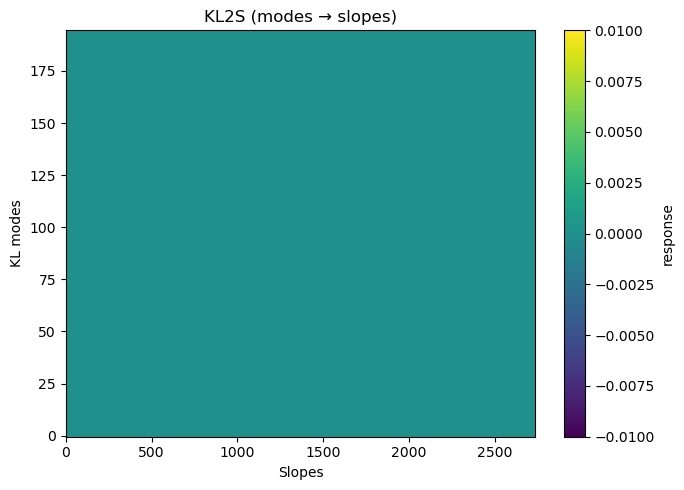

M2V shape: (241, 195)
V2M shape: (195, 241)


In [9]:
# --- Folders ---
seeing_1arcsec_folder_save_ol_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-16-28/'
seeing_1arcsec_folder_save_cl_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-17-15/'
seeing_1arcsec_folder_save_cl_4s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-18-04/'

# --- Load KL2S (modes → slopes) ---
kl2s_path = os.path.join(seeing_1arcsec_folder_save_cl_3s, 'M2S.fits')
KL2S = fits.getdata(kl2s_path).astype(np.float32)
print("KL2S shape:", KL2S.shape)

plt.figure(figsize=(7,5))
plt.imshow(KL2S, vmin=-1e-2, vmax=1e-2, aspect='auto', origin='lower')
plt.colorbar(label='response')
plt.title('KL2S (modes → slopes)')
plt.xlabel('Slopes')
plt.ylabel('KL modes')
plt.tight_layout()
plt.show()

# --- Load M2V ---
m2v_path = os.path.join(seeing_1arcsec_folder_save_ol_3s, 'M2V.fits')
M2V = fits.getdata(m2v_path).astype(np.float32)
print("M2V shape:", M2V.shape)

V2M = np.linalg.pinv(M2V)
print("V2M shape:", V2M.shape)

### Open loop 3s

modes_seeing_1arcsec shape: (5066, 195)
voltages_seeing_1arcsec shape: (5066, 241)
commands_seeing_1arcsec shape: (5066, 195)


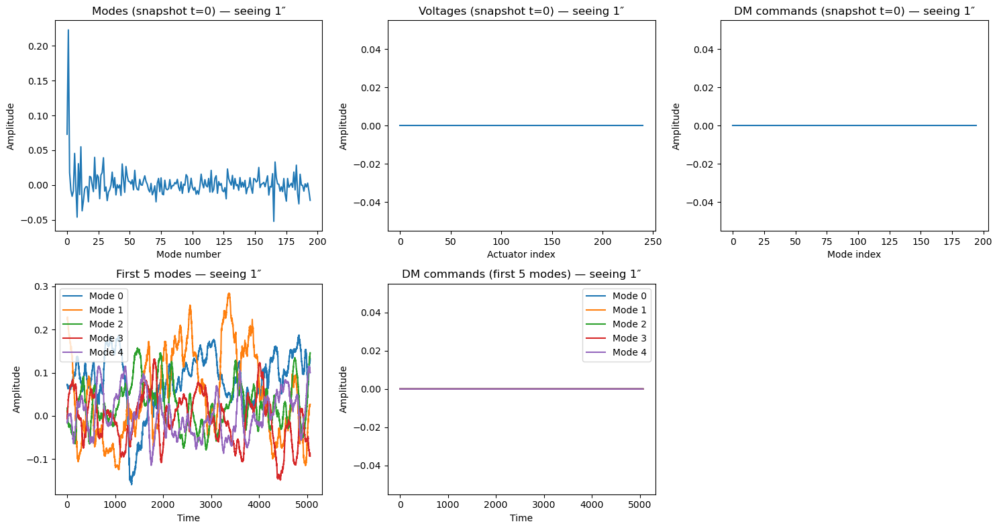

In [10]:
# --- Load data (seeing 1 arcsec) ---
folder = seeing_1arcsec_folder_save_ol_3s
modes_seeing_1arcsec     = fits.getdata(os.path.join(folder, 'modes.fits'))
voltages_seeing_1arcsec  = fits.getdata(os.path.join(folder, 'voltages.fits'))
commands_seeing_1arcsec  = fits.getdata(os.path.join(folder, 'commands.fits'))

print("modes_seeing_1arcsec shape:", modes_seeing_1arcsec.shape)
print("voltages_seeing_1arcsec shape:", voltages_seeing_1arcsec.shape)
print("commands_seeing_1arcsec shape:", commands_seeing_1arcsec.shape)

# --- Subplots ---
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.ravel()

snapshot_idx = 0  # time index for snapshot

# Snapshot of all modes
axes[0].plot(modes_seeing_1arcsec[snapshot_idx, :])
axes[0].set_title('Modes (snapshot t=0) — seeing 1″')
axes[0].set_xlabel('Mode number')
axes[0].set_ylabel('Amplitude')

# Snapshot of voltages across actuators
axes[1].plot(voltages_seeing_1arcsec[snapshot_idx, :])
axes[1].set_title('Voltages (snapshot t=0) — seeing 1″')
axes[1].set_xlabel('Actuator index')
axes[1].set_ylabel('Amplitude')

# Snapshot of DM command vector
axes[2].plot(commands_seeing_1arcsec[snapshot_idx, :])
axes[2].set_title('DM commands (snapshot t=0) — seeing 1″')
axes[2].set_xlabel('Mode index')
axes[2].set_ylabel('Amplitude')

# First 5 modes over time
for i in range(5):
    axes[3].plot(modes_seeing_1arcsec[:, i], label=f'Mode {i}')
axes[3].set_title('First 5 modes — seeing 1″')
axes[3].set_xlabel('Time')
axes[3].set_ylabel('Amplitude')
axes[3].legend()

# First 5 DM command projections over time
for i in range(5):
    axes[4].plot(commands_seeing_1arcsec[:, i], label=f'Mode {i}')
axes[4].set_title('DM commands (first 5 modes) — seeing 1″')
axes[4].set_xlabel('Time')
axes[4].set_ylabel('Amplitude')
axes[4].legend()

# Remove the unused subplot (bottom right)
fig.delaxes(axes[5])

plt.tight_layout()
plt.show()


### Closed loop 3s

modes_seeing_1arcsec shape: (5066, 195)
voltages_seeing_1arcsec shape: (5066, 241)
commands_seeing_1arcsec shape: (5066, 195)


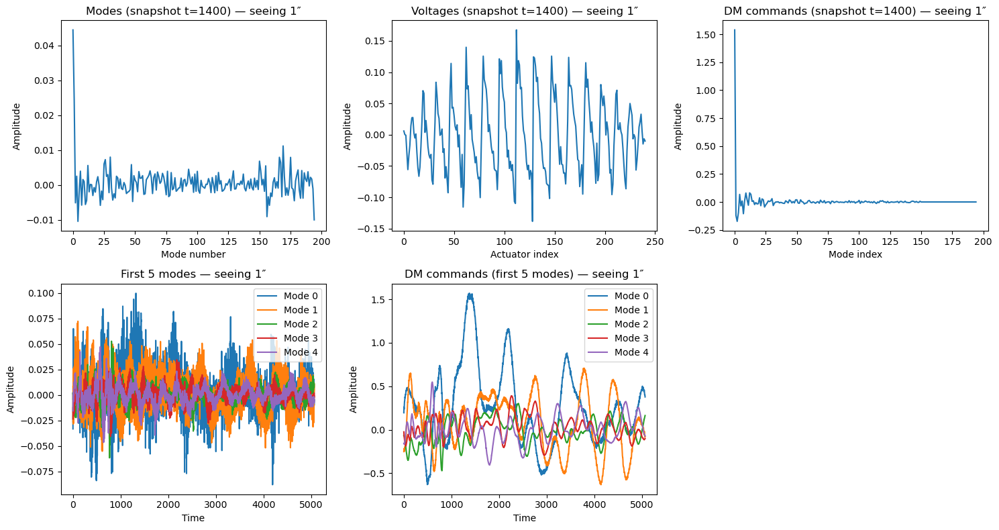

In [11]:
# --- Load data (seeing 1 arcsec, closed loop) ---
folder = seeing_1arcsec_folder_save_cl_3s
modes_seeing_1arcsec     = fits.getdata(os.path.join(folder, 'modes.fits'))
voltages_seeing_1arcsec  = fits.getdata(os.path.join(folder, 'voltages.fits'))
commands_seeing_1arcsec  = fits.getdata(os.path.join(folder, 'commands.fits'))

print("modes_seeing_1arcsec shape:", modes_seeing_1arcsec.shape)
print("voltages_seeing_1arcsec shape:", voltages_seeing_1arcsec.shape)
print("commands_seeing_1arcsec shape:", commands_seeing_1arcsec.shape)

%matplotlib inline

# --- Subplots ---
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.ravel()

snapshot_idx = 1400  # time index for snapshot

# 1) Snapshot of all modes
axes[0].plot(modes_seeing_1arcsec[snapshot_idx, :])
axes[0].set_title(f'Modes (snapshot t={snapshot_idx}) — seeing 1″')
axes[0].set_xlabel('Mode number')
axes[0].set_ylabel('Amplitude')

# 2) Snapshot of voltages
axes[1].plot(voltages_seeing_1arcsec[snapshot_idx, :])
axes[1].set_title(f'Voltages (snapshot t={snapshot_idx}) — seeing 1″')
axes[1].set_xlabel('Actuator index')
axes[1].set_ylabel('Amplitude')

# 3) Snapshot of DM commands
axes[2].plot(commands_seeing_1arcsec[snapshot_idx, :])
axes[2].set_title(f'DM commands (snapshot t={snapshot_idx}) — seeing 1″')
axes[2].set_xlabel('Mode index')
axes[2].set_ylabel('Amplitude')

# 4) First 5 modes over time
for i in range(5):
    axes[3].plot(modes_seeing_1arcsec[:, i], label=f'Mode {i}')
axes[3].set_title('First 5 modes — seeing 1″')
axes[3].set_xlabel('Time')
axes[3].set_ylabel('Amplitude')
axes[3].legend()

# 5) First 5 DM command projections over time
for i in range(5):
    axes[4].plot(commands_seeing_1arcsec[:, i], label=f'Mode {i}')
axes[4].set_title('DM commands (first 5 modes) — seeing 1″')
axes[4].set_xlabel('Time')
axes[4].set_ylabel('Amplitude')
axes[4].legend()

# Remove unused subplot (bottom-right)
fig.delaxes(axes[5])

plt.tight_layout()
plt.show()


### Comparison

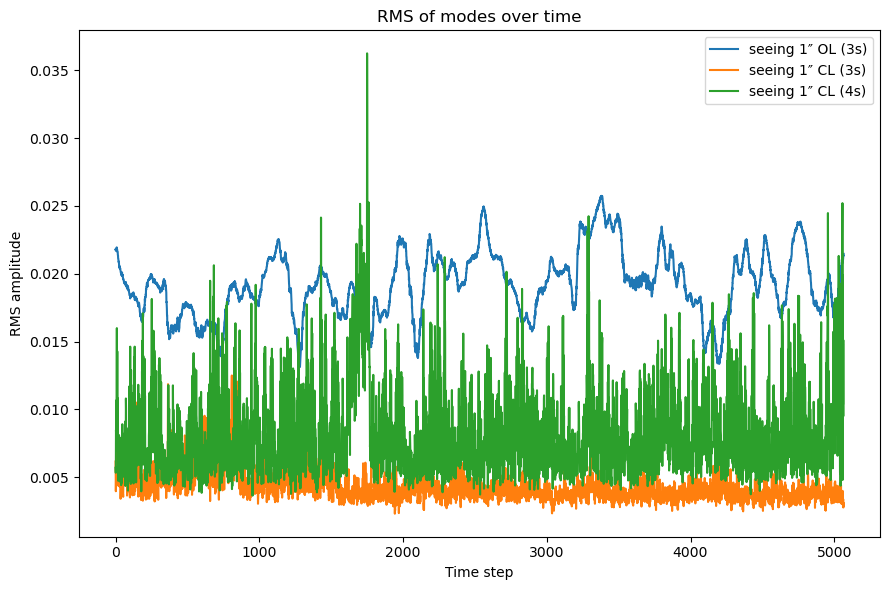

In [12]:
# --- Compute RMS time series for each dataset ---
seeing_1arcsec_rms_modes_ol_3s = compute_modes_rms(seeing_1arcsec_folder_save_ol_3s)
seeing_1arcsec_rms_modes_cl_3s = compute_modes_rms(seeing_1arcsec_folder_save_cl_3s)
seeing_1arcsec_rms_modes_cl_4s = compute_modes_rms(seeing_1arcsec_folder_save_cl_4s)

# --- Plot them together ---
plt.figure(figsize=(9,6))
plt.plot(seeing_1arcsec_rms_modes_ol_3s, label='seeing 1″ OL (3s)')
plt.plot(seeing_1arcsec_rms_modes_cl_3s, label='seeing 1″ CL (3s)')
plt.plot(seeing_1arcsec_rms_modes_cl_4s, label='seeing 1″ CL (4s)')
plt.title('RMS of modes over time')
plt.xlabel('Time step')
plt.ylabel('RMS amplitude')
plt.legend()
plt.tight_layout()
plt.show()

## seeing 2"

In [13]:
# --- Folders (seeing 2arcsec) ---
seeing_2arcsec_folder_save_ol_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-19-34/'
seeing_2arcsec_folder_save_cl_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-20-26/'
seeing_2arcsec_folder_save_cl_4s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-21-24/'

# --- Load KL2S (modes → slopes) ---
kl2s_path = os.path.join(seeing_2arcsec_folder_save_cl_3s, 'M2S.fits')
KL2S = fits.getdata(kl2s_path).astype(np.float32)
print("KL2S shape:", KL2S.shape)

#plt.figure(figsize=(7,5))
#plt.imshow(KL2S, vmin=-1e-2, vmax=1e-2, aspect='auto', origin='lower')
#plt.colorbar(label='response')
#plt.title('KL2S (modes → slopes)″')
#plt.xlabel('Slopes')
#plt.ylabel('KL modes')
#plt.tight_layout()
#plt.show()

# --- Load M2V ---
m2v_path = os.path.join(seeing_2arcsec_folder_save_ol_3s, 'M2V.fits')
M2V = fits.getdata(m2v_path).astype(np.float32)
print("M2V shape:", M2V.shape)

V2M = np.linalg.pinv(M2V)
print("V2M shape:", V2M.shape)


KL2S shape: (195, 2737)
M2V shape: (241, 195)
V2M shape: (195, 241)


## Open loop 3s

modes_seeing_2arcsec shape: (5066, 195)
voltages_seeing_2arcsec shape: (5066, 241)
commands_seeing_2arcsec shape: (5066, 195)


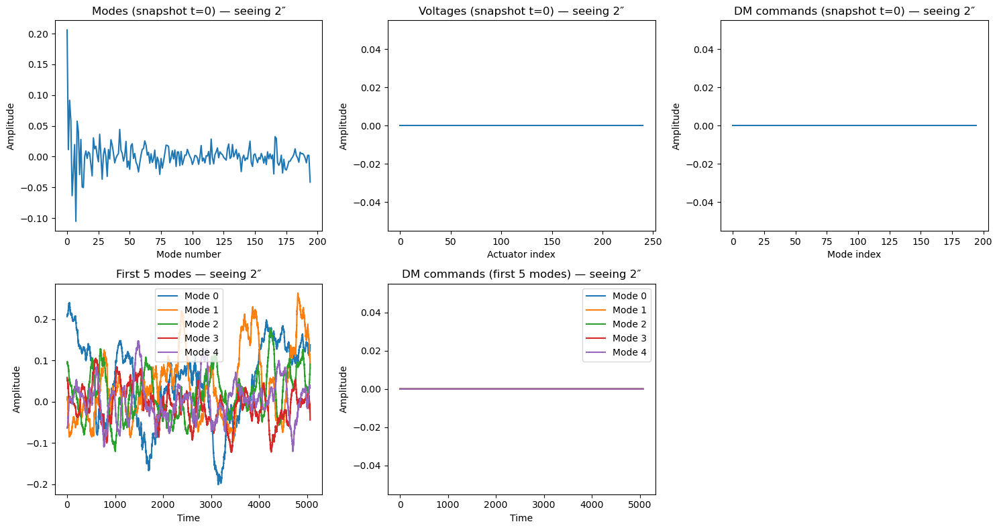

In [14]:
# --- Load data (seeing 2 arcsec, open loop) ---
folder = seeing_2arcsec_folder_save_ol_3s
modes_seeing_2arcsec     = fits.getdata(os.path.join(folder, 'modes.fits'))
voltages_seeing_2arcsec  = fits.getdata(os.path.join(folder, 'voltages.fits'))
commands_seeing_2arcsec  = fits.getdata(os.path.join(folder, 'commands.fits'))

print("modes_seeing_2arcsec shape:", modes_seeing_2arcsec.shape)
print("voltages_seeing_2arcsec shape:", voltages_seeing_2arcsec.shape)
print("commands_seeing_2arcsec shape:", commands_seeing_2arcsec.shape)

# --- Subplots ---
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.ravel()

snapshot_idx = 0  # time index for snapshot

# 1) Snapshot of all modes
axes[0].plot(modes_seeing_2arcsec[snapshot_idx, :])
axes[0].set_title(f'Modes (snapshot t={snapshot_idx}) — seeing 2″')
axes[0].set_xlabel('Mode number')
axes[0].set_ylabel('Amplitude')

# 2) Snapshot of voltages
axes[1].plot(voltages_seeing_2arcsec[snapshot_idx, :])
axes[1].set_title(f'Voltages (snapshot t={snapshot_idx}) — seeing 2″')
axes[1].set_xlabel('Actuator index')
axes[1].set_ylabel('Amplitude')

# 3) Snapshot of DM commands
axes[2].plot(commands_seeing_2arcsec[snapshot_idx, :])
axes[2].set_title(f'DM commands (snapshot t={snapshot_idx}) — seeing 2″')
axes[2].set_xlabel('Mode index')
axes[2].set_ylabel('Amplitude')

# 4) First 5 modes over time
for i in range(5):
    axes[3].plot(modes_seeing_2arcsec[:, i], label=f'Mode {i}')
axes[3].set_title('First 5 modes — seeing 2″')
axes[3].set_xlabel('Time')
axes[3].set_ylabel('Amplitude')
axes[3].legend()

# 5) First 5 DM command projections over time
for i in range(5):
    axes[4].plot(commands_seeing_2arcsec[:, i], label=f'Mode {i}')
axes[4].set_title('DM commands (first 5 modes) — seeing 2″')
axes[4].set_xlabel('Time')
axes[4].set_ylabel('Amplitude')
axes[4].legend()

# Remove unused subplot (bottom-right)
fig.delaxes(axes[5])

plt.tight_layout()
plt.show()


## Closed loop 3s

modes_seeing_2arcsec shape: (5066, 195)
voltages_seeing_2arcsec shape: (5066, 241)
commands_seeing_2arcsec shape: (5066, 195)


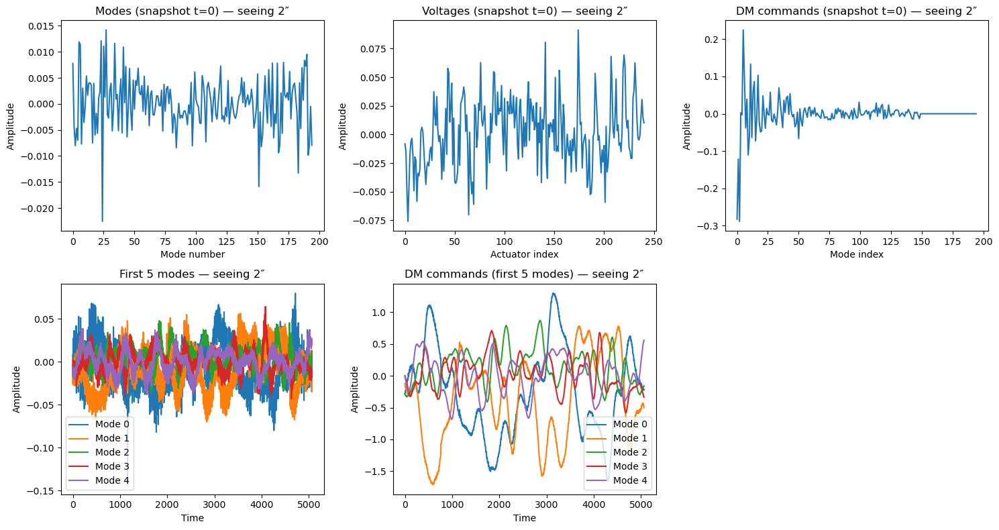

In [15]:
# --- Load data (seeing 2 arcsec, closed loop) ---
folder = seeing_2arcsec_folder_save_cl_3s
modes_seeing_2arcsec     = fits.getdata(os.path.join(folder, 'modes.fits'))
voltages_seeing_2arcsec  = fits.getdata(os.path.join(folder, 'voltages.fits'))
commands_seeing_2arcsec  = fits.getdata(os.path.join(folder, 'commands.fits'))

print("modes_seeing_2arcsec shape:", modes_seeing_2arcsec.shape)
print("voltages_seeing_2arcsec shape:", voltages_seeing_2arcsec.shape)
print("commands_seeing_2arcsec shape:", commands_seeing_2arcsec.shape)

# --- Subplots ---
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.ravel()

snapshot_idx = 0  # time index for snapshot

# 1) Snapshot of all modes
axes[0].plot(modes_seeing_2arcsec[snapshot_idx, :])
axes[0].set_title(f'Modes (snapshot t={snapshot_idx}) — seeing 2″')
axes[0].set_xlabel('Mode number')
axes[0].set_ylabel('Amplitude')

# 2) Snapshot of voltages
axes[1].plot(voltages_seeing_2arcsec[snapshot_idx, :])
axes[1].set_title(f'Voltages (snapshot t={snapshot_idx}) — seeing 2″')
axes[1].set_xlabel('Actuator index')
axes[1].set_ylabel('Amplitude')

# 3) Snapshot of DM commands
axes[2].plot(commands_seeing_2arcsec[snapshot_idx, :])
axes[2].set_title(f'DM commands (snapshot t={snapshot_idx}) — seeing 2″')
axes[2].set_xlabel('Mode index')
axes[2].set_ylabel('Amplitude')

# 4) First 5 modes over time
for i in range(5):
    axes[3].plot(modes_seeing_2arcsec[:, i], label=f'Mode {i}')
axes[3].set_title('First 5 modes — seeing 2″')
axes[3].set_xlabel('Time')
axes[3].set_ylabel('Amplitude')
axes[3].legend()

# 5) First 5 DM command projections over time
for i in range(5):
    axes[4].plot(commands_seeing_2arcsec[:, i], label=f'Mode {i}')
axes[4].set_title('DM commands (first 5 modes) — seeing 2″')
axes[4].set_xlabel('Time')
axes[4].set_ylabel('Amplitude')
axes[4].legend()

# Remove unused subplot (bottom-right)
fig.delaxes(axes[5])

plt.tight_layout()
plt.show()


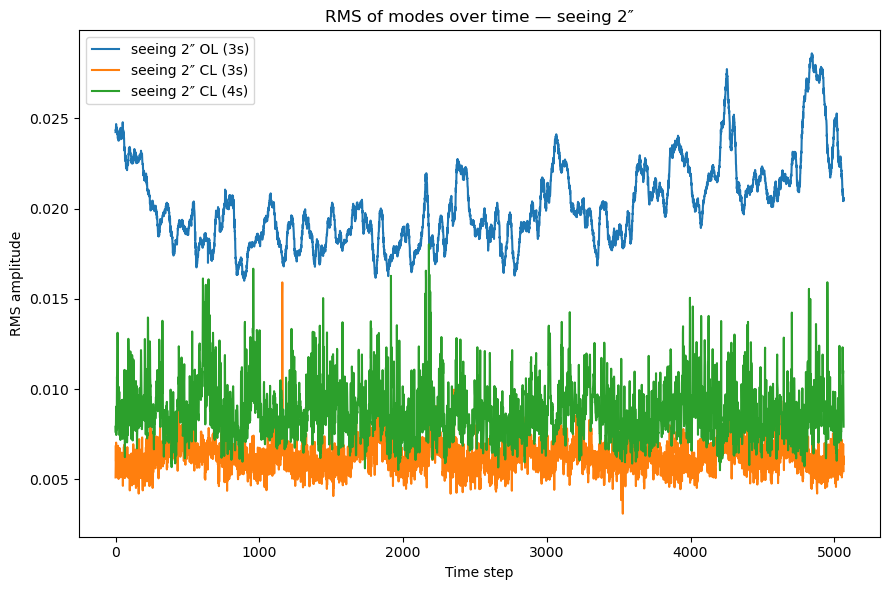

In [16]:
# --- Compute RMS time series for each dataset (seeing 2 arcsec) ---
seeing_2arcsec_rms_modes_ol_3s = compute_modes_rms(seeing_2arcsec_folder_save_ol_3s)
seeing_2arcsec_rms_modes_cl_3s = compute_modes_rms(seeing_2arcsec_folder_save_cl_3s)
seeing_2arcsec_rms_modes_cl_4s = compute_modes_rms(seeing_2arcsec_folder_save_cl_4s)

# --- Plot them together ---
plt.figure(figsize=(9,6))
plt.plot(seeing_2arcsec_rms_modes_ol_3s, label='seeing 2″ OL (3s)')
plt.plot(seeing_2arcsec_rms_modes_cl_3s, label='seeing 2″ CL (3s)')
plt.plot(seeing_2arcsec_rms_modes_cl_4s, label='seeing 2″ CL (4s)')
plt.title('RMS of modes over time — seeing 2″')
plt.xlabel('Time step')
plt.ylabel('RMS amplitude')
plt.legend()
plt.tight_layout()
plt.show()


## seeing 3"

In [17]:
# --- Folders (seeing 3arcsec) ---
seeing_3arcsec_folder_save_ol_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-22-21/'
seeing_3arcsec_folder_save_cl_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-24-42/'
seeing_3arcsec_folder_save_cl_4s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-25-39/'

# --- Load KL2S (modes → slopes) ---
kl2s_path = os.path.join(seeing_3arcsec_folder_save_cl_3s, 'M2S.fits')
KL2S = fits.getdata(kl2s_path).astype(np.float32)
print("KL2S shape:", KL2S.shape)

#plt.figure(figsize=(7,5))
#plt.imshow(KL2S, vmin=-1e-2, vmax=1e-2, aspect='auto', origin='lower')
#plt.colorbar(label='response')
#plt.title('KL2S (modes → slopes)')
#plt.xlabel('Slopes')
#plt.ylabel('KL modes')
#plt.tight_layout()
#plt.show()

# --- Load M2V ---
m2v_path = os.path.join(seeing_3arcsec_folder_save_ol_3s, 'M2V.fits')
M2V = fits.getdata(m2v_path).astype(np.float32)
print("M2V shape:", M2V.shape)

V2M = np.linalg.pinv(M2V)
print("V2M shape:", V2M.shape)


KL2S shape: (195, 2737)
M2V shape: (241, 195)
V2M shape: (195, 241)


## Open loop 4s

modes_seeing_3arcsec shape: (5066, 195)
voltages_seeing_3arcsec shape: (5066, 241)
commands_seeing_3arcsec shape: (5066, 195)


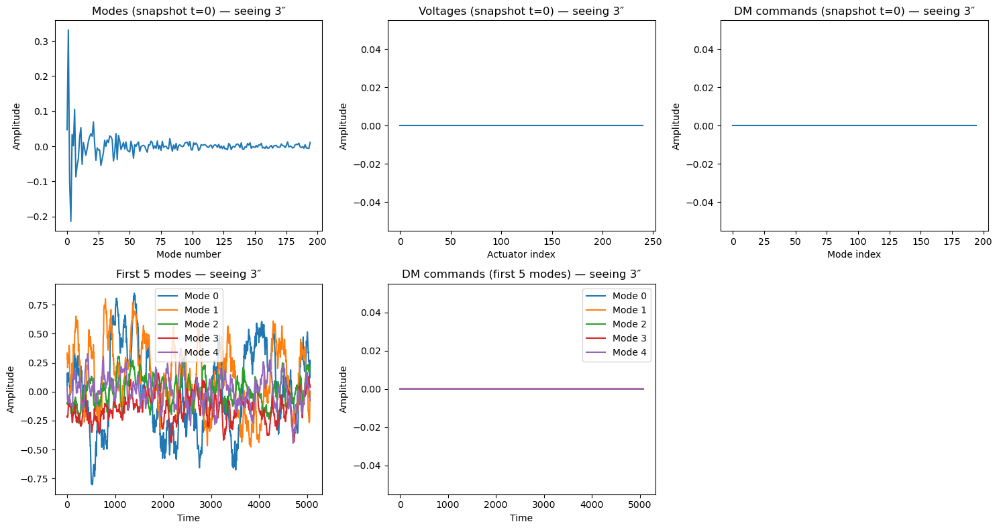

In [18]:
# --- Load data (seeing 3 arcsec, open loop) ---
folder = seeing_3arcsec_folder_save_ol_3s
modes_seeing_3arcsec     = fits.getdata(os.path.join(folder, 'modes.fits'))
voltages_seeing_3arcsec  = fits.getdata(os.path.join(folder, 'voltages.fits'))
commands_seeing_3arcsec  = fits.getdata(os.path.join(folder, 'commands.fits'))

print("modes_seeing_3arcsec shape:", modes_seeing_3arcsec.shape)
print("voltages_seeing_3arcsec shape:", voltages_seeing_3arcsec.shape)
print("commands_seeing_3arcsec shape:", commands_seeing_3arcsec.shape)

# --- Subplots ---
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.ravel()

snapshot_idx = 0  # time index for snapshot

# 1) Snapshot of all modes
axes[0].plot(modes_seeing_3arcsec[snapshot_idx, :])
axes[0].set_title(f'Modes (snapshot t={snapshot_idx}) — seeing 3″')
axes[0].set_xlabel('Mode number')
axes[0].set_ylabel('Amplitude')

# 2) Snapshot of voltages
axes[1].plot(voltages_seeing_3arcsec[snapshot_idx, :])
axes[1].set_title(f'Voltages (snapshot t={snapshot_idx}) — seeing 3″')
axes[1].set_xlabel('Actuator index')
axes[1].set_ylabel('Amplitude')

# 3) Snapshot of DM commands
axes[2].plot(commands_seeing_3arcsec[snapshot_idx, :])
axes[2].set_title(f'DM commands (snapshot t={snapshot_idx}) — seeing 3″')
axes[2].set_xlabel('Mode index')
axes[2].set_ylabel('Amplitude')

# 4) First 5 modes over time
for i in range(5):
    axes[3].plot(modes_seeing_3arcsec[:, i], label=f'Mode {i}')
axes[3].set_title('First 5 modes — seeing 3″')
axes[3].set_xlabel('Time')
axes[3].set_ylabel('Amplitude')
axes[3].legend()

# 5) First 5 DM command projections over time
for i in range(5):
    axes[4].plot(commands_seeing_3arcsec[:, i], label=f'Mode {i}')
axes[4].set_title('DM commands (first 5 modes) — seeing 3″')
axes[4].set_xlabel('Time')
axes[4].set_ylabel('Amplitude')
axes[4].legend()

# Remove unused subplot (bottom-right)
fig.delaxes(axes[5])

plt.tight_layout()
plt.show()


## Closed loop 3s

modes_seeing_3arcsec shape: (5066, 195)
voltages_seeing_3arcsec shape: (5066, 241)
commands_seeing_3arcsec shape: (5066, 195)


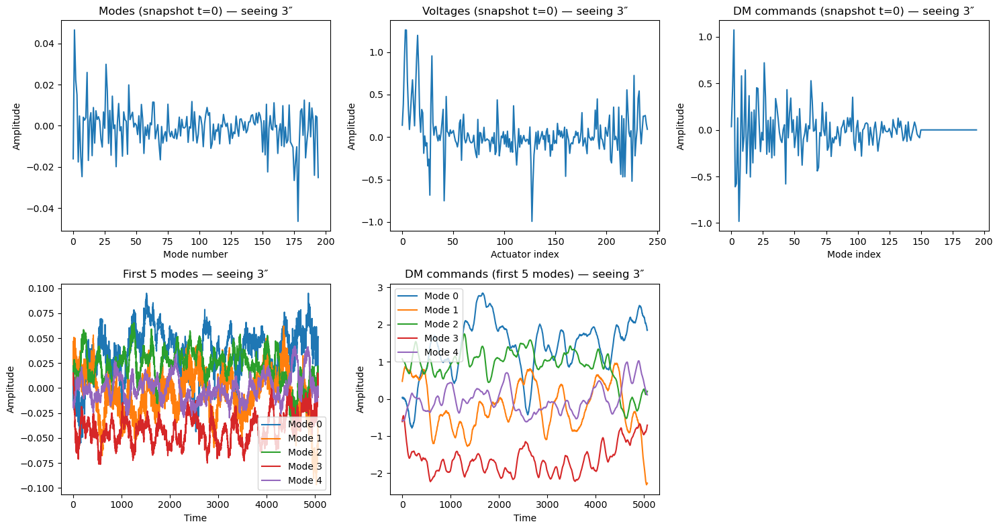

In [19]:
# --- Load data (seeing 3 arcsec, closed loop) ---
folder = seeing_3arcsec_folder_save_cl_3s
modes_seeing_3arcsec     = fits.getdata(os.path.join(folder, 'modes.fits'))
voltages_seeing_3arcsec  = fits.getdata(os.path.join(folder, 'voltages.fits'))
commands_seeing_3arcsec  = fits.getdata(os.path.join(folder, 'commands.fits'))

print("modes_seeing_3arcsec shape:", modes_seeing_3arcsec.shape)
print("voltages_seeing_3arcsec shape:", voltages_seeing_3arcsec.shape)
print("commands_seeing_3arcsec shape:", commands_seeing_3arcsec.shape)

# --- Subplots ---
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.ravel()

snapshot_idx = 0  # time index for snapshot

# 1) Snapshot of all modes
axes[0].plot(modes_seeing_3arcsec[snapshot_idx, :])
axes[0].set_title(f'Modes (snapshot t={snapshot_idx}) — seeing 3″')
axes[0].set_xlabel('Mode number')
axes[0].set_ylabel('Amplitude')

# 2) Snapshot of voltages
axes[1].plot(voltages_seeing_3arcsec[snapshot_idx, :])
axes[1].set_title(f'Voltages (snapshot t={snapshot_idx}) — seeing 3″')
axes[1].set_xlabel('Actuator index')
axes[1].set_ylabel('Amplitude')

# 3) Snapshot of DM commands
axes[2].plot(commands_seeing_3arcsec[snapshot_idx, :])
axes[2].set_title(f'DM commands (snapshot t={snapshot_idx}) — seeing 3″')
axes[2].set_xlabel('Mode index')
axes[2].set_ylabel('Amplitude')

# 4) First 5 modes over time
for i in range(5):
    axes[3].plot(modes_seeing_3arcsec[:, i], label=f'Mode {i}')
axes[3].set_title('First 5 modes — seeing 3″')
axes[3].set_xlabel('Time')
axes[3].set_ylabel('Amplitude')
axes[3].legend()

# 5) First 5 DM command projections over time
for i in range(5):
    axes[4].plot(commands_seeing_3arcsec[:, i], label=f'Mode {i}')
axes[4].set_title('DM commands (first 5 modes) — seeing 3″')
axes[4].set_xlabel('Time')
axes[4].set_ylabel('Amplitude')
axes[4].legend()

# Remove unused subplot (bottom-right)
fig.delaxes(axes[5])

plt.tight_layout()
plt.show()


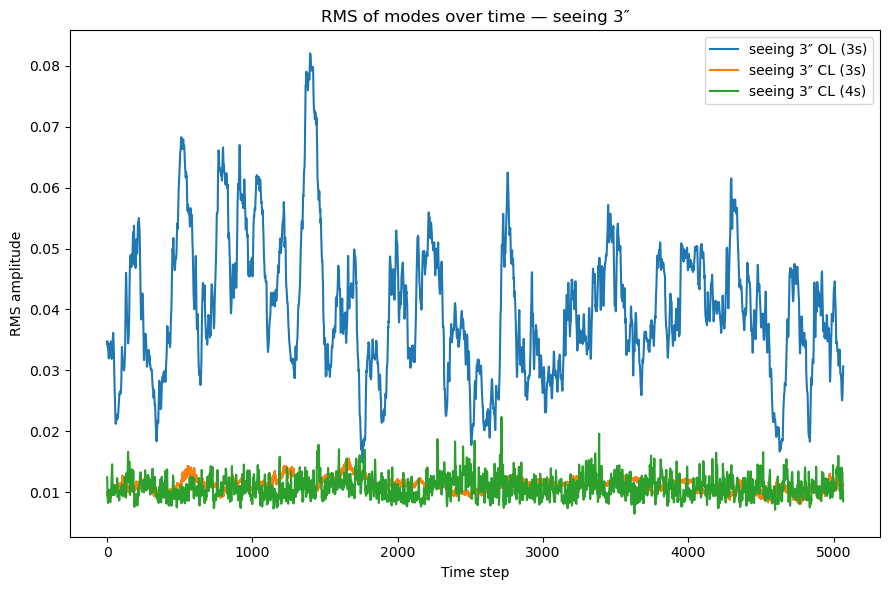

In [20]:
# --- Compute RMS time series for each dataset (seeing 3 arcsec) ---
seeing_3arcsec_rms_modes_ol_3s = compute_modes_rms(seeing_3arcsec_folder_save_ol_3s)
seeing_3arcsec_rms_modes_cl_3s = compute_modes_rms(seeing_3arcsec_folder_save_cl_3s)
seeing_3arcsec_rms_modes_cl_4s = compute_modes_rms(seeing_3arcsec_folder_save_cl_4s)

# --- Plot them together ---
plt.figure(figsize=(9,6))
plt.plot(seeing_3arcsec_rms_modes_ol_3s, label='seeing 3″ OL (3s)')
plt.plot(seeing_3arcsec_rms_modes_cl_3s, label='seeing 3″ CL (3s)')
plt.plot(seeing_3arcsec_rms_modes_cl_4s, label='seeing 3″ CL (4s)')
plt.title('RMS of modes over time — seeing 3″')
plt.xlabel('Time step')
plt.ylabel('RMS amplitude')
plt.legend()
plt.tight_layout()
plt.show()


## seeing 4"

In [21]:
# --- Folders (seeing 4arcsec) ---
seeing_4arcsec_folder_save_ol_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-27-25/'
seeing_4arcsec_folder_save_cl_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-28-34/'
seeing_4arcsec_folder_save_cl_4s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-29-42/'

# --- Load KL2S (modes → slopes) ---
kl2s_path = os.path.join(seeing_4arcsec_folder_save_cl_3s, 'M2S.fits')
KL2S = fits.getdata(kl2s_path).astype(np.float32)
print("KL2S shape:", KL2S.shape)

#plt.figure(figsize=(7,5))
#plt.imshow(KL2S, vmin=-1e-2, vmax=1e-2, aspect='auto', origin='lower')
#plt.colorbar(label='response')
#plt.title('KL2S (modes → slopes)')
#plt.xlabel('Slopes')
#plt.ylabel('KL modes')
#plt.tight_layout()
#plt.show()

# --- Load M2V ---
m2v_path = os.path.join(seeing_4arcsec_folder_save_ol_3s, 'M2V.fits')
M2V = fits.getdata(m2v_path).astype(np.float32)
print("M2V shape:", M2V.shape)

V2M = np.linalg.pinv(M2V)
print("V2M shape:", V2M.shape)


KL2S shape: (195, 2737)
M2V shape: (241, 195)
V2M shape: (195, 241)


## Open loop 3s

modes_seeing_4arcsec shape: (5066, 195)
voltages_seeing_4arcsec shape: (5066, 241)
commands_seeing_4arcsec shape: (5066, 195)


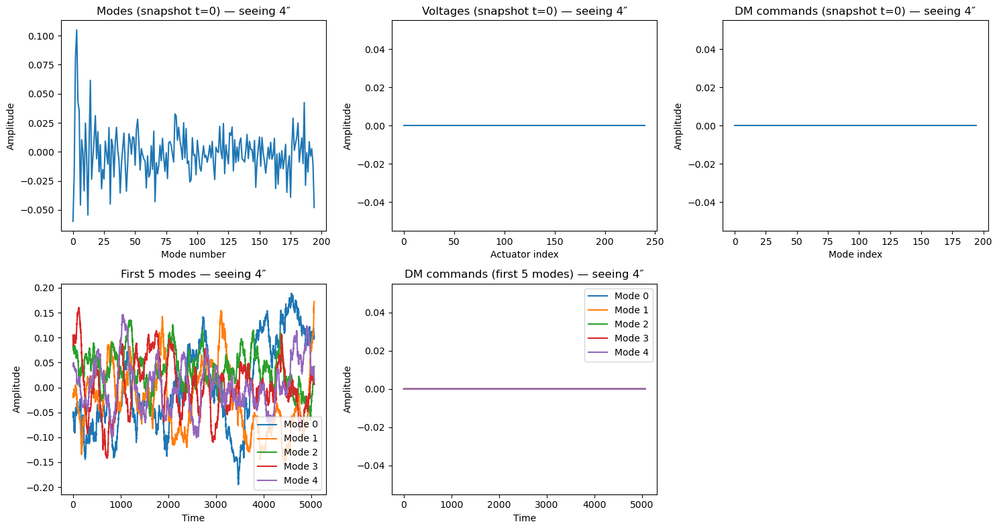

In [22]:
# --- Load data (seeing 4 arcsec, open loop) ---
folder = seeing_4arcsec_folder_save_ol_3s
modes_seeing_4arcsec     = fits.getdata(os.path.join(folder, 'modes.fits'))
voltages_seeing_4arcsec  = fits.getdata(os.path.join(folder, 'voltages.fits'))
commands_seeing_4arcsec  = fits.getdata(os.path.join(folder, 'commands.fits'))

print("modes_seeing_4arcsec shape:", modes_seeing_4arcsec.shape)
print("voltages_seeing_4arcsec shape:", voltages_seeing_4arcsec.shape)
print("commands_seeing_4arcsec shape:", commands_seeing_4arcsec.shape)

# --- Subplots ---
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.ravel()

snapshot_idx = 0  # time index for snapshot

# 1) Snapshot of all modes
axes[0].plot(modes_seeing_4arcsec[snapshot_idx, :])
axes[0].set_title(f'Modes (snapshot t={snapshot_idx}) — seeing 4″')
axes[0].set_xlabel('Mode number')
axes[0].set_ylabel('Amplitude')

# 2) Snapshot of voltages
axes[1].plot(voltages_seeing_4arcsec[snapshot_idx, :])
axes[1].set_title(f'Voltages (snapshot t={snapshot_idx}) — seeing 4″')
axes[1].set_xlabel('Actuator index')
axes[1].set_ylabel('Amplitude')

# 3) Snapshot of DM commands
axes[2].plot(commands_seeing_4arcsec[snapshot_idx, :])
axes[2].set_title(f'DM commands (snapshot t={snapshot_idx}) — seeing 4″')
axes[2].set_xlabel('Mode index')
axes[2].set_ylabel('Amplitude')

# 4) First 5 modes over time
for i in range(5):
    axes[3].plot(modes_seeing_4arcsec[:, i], label=f'Mode {i}')
axes[3].set_title('First 5 modes — seeing 4″')
axes[3].set_xlabel('Time')
axes[3].set_ylabel('Amplitude')
axes[3].legend()

# 5) First 5 DM command projections over time
for i in range(5):
    axes[4].plot(commands_seeing_4arcsec[:, i], label=f'Mode {i}')
axes[4].set_title('DM commands (first 5 modes) — seeing 4″')
axes[4].set_xlabel('Time')
axes[4].set_ylabel('Amplitude')
axes[4].legend()

# Remove unused subplot (bottom-right)
fig.delaxes(axes[5])

plt.tight_layout()
plt.show()


## Closed loop 3s

modes_seeing_4arcsec shape: (5066, 195)
voltages_seeing_4arcsec shape: (5066, 241)
commands_seeing_4arcsec shape: (5066, 195)


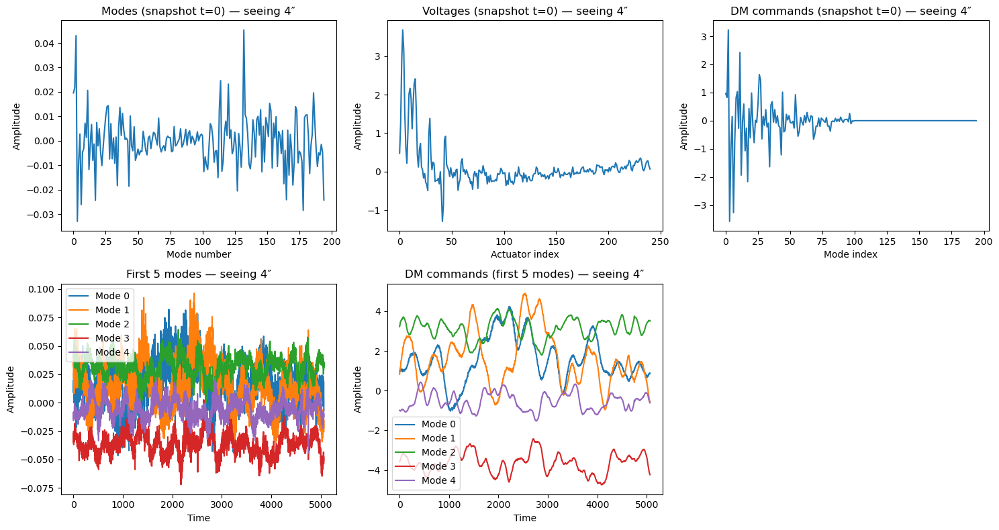

In [23]:
# --- Load data (seeing 4 arcsec, closed loop) ---
folder = seeing_4arcsec_folder_save_cl_3s
modes_seeing_4arcsec     = fits.getdata(os.path.join(folder, 'modes.fits'))
voltages_seeing_4arcsec  = fits.getdata(os.path.join(folder, 'voltages.fits'))
commands_seeing_4arcsec  = fits.getdata(os.path.join(folder, 'commands.fits'))

print("modes_seeing_4arcsec shape:", modes_seeing_4arcsec.shape)
print("voltages_seeing_4arcsec shape:", voltages_seeing_4arcsec.shape)
print("commands_seeing_4arcsec shape:", commands_seeing_4arcsec.shape)

# --- Subplots ---
fig, axes = plt.subplots(2, 3, figsize=(15, 8))
axes = axes.ravel()

snapshot_idx = 0  # time index for snapshot

# 1) Snapshot of all modes
axes[0].plot(modes_seeing_4arcsec[snapshot_idx, :])
axes[0].set_title(f'Modes (snapshot t={snapshot_idx}) — seeing 4″')
axes[0].set_xlabel('Mode number')
axes[0].set_ylabel('Amplitude')

# 2) Snapshot of voltages
axes[1].plot(voltages_seeing_4arcsec[snapshot_idx, :])
axes[1].set_title(f'Voltages (snapshot t={snapshot_idx}) — seeing 4″')
axes[1].set_xlabel('Actuator index')
axes[1].set_ylabel('Amplitude')

# 3) Snapshot of DM commands
axes[2].plot(commands_seeing_4arcsec[snapshot_idx, :])
axes[2].set_title(f'DM commands (snapshot t={snapshot_idx}) — seeing 4″')
axes[2].set_xlabel('Mode index')
axes[2].set_ylabel('Amplitude')

# 4) First 5 modes over time
for i in range(5):
    axes[3].plot(modes_seeing_4arcsec[:, i], label=f'Mode {i}')
axes[3].set_title('First 5 modes — seeing 4″')
axes[3].set_xlabel('Time')
axes[3].set_ylabel('Amplitude')
axes[3].legend()

# 5) First 5 DM command projections over time
for i in range(5):
    axes[4].plot(commands_seeing_4arcsec[:, i], label=f'Mode {i}')
axes[4].set_title('DM commands (first 5 modes) — seeing 4″')
axes[4].set_xlabel('Time')
axes[4].set_ylabel('Amplitude')
axes[4].legend()

# Remove unused subplot (bottom-right)
fig.delaxes(axes[5])

plt.tight_layout()
plt.show()


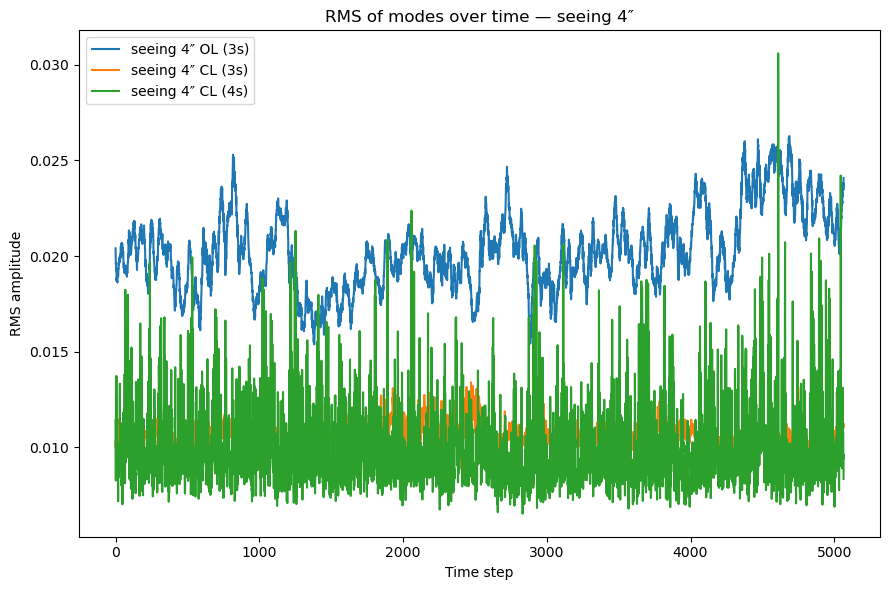

In [24]:
# --- Compute RMS time series for each dataset (seeing 4 arcsec) ---
seeing_4arcsec_rms_modes_ol_3s = compute_modes_rms(seeing_4arcsec_folder_save_ol_3s)
seeing_4arcsec_rms_modes_cl_3s = compute_modes_rms(seeing_4arcsec_folder_save_cl_3s)
seeing_4arcsec_rms_modes_cl_4s = compute_modes_rms(seeing_4arcsec_folder_save_cl_4s)

# --- Plot them together ---
plt.figure(figsize=(9,6))
plt.plot(seeing_4arcsec_rms_modes_ol_3s, label='seeing 4″ OL (3s)')
plt.plot(seeing_4arcsec_rms_modes_cl_3s, label='seeing 4″ CL (3s)')
plt.plot(seeing_4arcsec_rms_modes_cl_4s, label='seeing 4″ CL (4s)')
plt.title('RMS of modes over time — seeing 4″')
plt.xlabel('Time step')
plt.ylabel('RMS amplitude')
plt.legend()
plt.tight_layout()
plt.show()


In [83]:
from scipy.ndimage import center_of_mass
from matplotlib.patches import Circle
from scipy.ndimage import fourier_shift
from scipy.optimize import curve_fit

def center_psf(img, nx=None, low=0.1, integer=False):
    """
    Center a PSF using its center of gravity (no background subtraction).
    Optionally crop/pad to (nx,nx).
    """
    y = np.arange(img.shape[0])
    x = np.arange(img.shape[1])
    X, Y = np.meshgrid(x, y)

    # threshold to avoid noisy halo biasing CoG
    img_filt = img - np.median(img)
    img_filt = np.clip(img_filt - low*np.max(img_filt), 0, None)

    cx = np.sum(img_filt*X)/np.sum(img_filt)
    cy = np.sum(img_filt*Y)/np.sum(img_filt)
    if integer:
        cx, cy = int(np.round(cx)), int(np.round(cy))

    # desired center
    cx_target = (img.shape[1]-1)/2
    cy_target = (img.shape[0]-1)/2
    shift = [cy_target-cy, cx_target-cx]

    # subpixel shift
    img_centered = np.fft.ifftn(fourier_shift(np.fft.fftn(img), shift)).real

    # crop/pad if requested
    if nx is not None:
        y0 = (img_centered.shape[0]-nx)//2
        x0 = (img_centered.shape[1]-nx)//2
        img_centered = img_centered[y0:y0+nx, x0:x0+nx]

    return img_centered, (cx, cy)

def compute_integrated_psf(folder, background_subtraction=True, centering=False,
                           nx=150, low=0.1):
    """
    Load PSF cube, subtract background if requested,
    optionally center PSF on its CoG and crop to (nx,nx).
    If centering=False, use fixed crop [225:375, 50:200].
    """
    psf = fits.getdata(os.path.join(folder, 'cblue.fits'))  # shape (nt, ny, nx)

    if background_subtraction:
        # Estimate background from first 100 columns
        background = np.mean(np.mean(psf[:, :100, :], axis=0), axis=0)
        psf = psf - background[None, None, :]

    # Collapse cube into a single PSF
    psf_sum = np.sum(psf, axis=0)

    if centering:
        # use CoG-based centering
        psf_sum, (cx, cy) = center_psf(psf_sum, nx=nx, low=low)
    else:
        # fixed crop (225:375, 50:200), same as your original code
        # psf_sum = psf_sum[225:375, 50:200]
        psf_sum = psf_sum[175:425, 0:250]

    return psf_sum



# ---------- Helper function ----------
def psf_centroid_local(psf, halfwidth=10):
    """Find centroid around brightest pixel to avoid halo bias."""
    psf = np.nan_to_num(psf, nan=0.0)
    
    # Brightest pixel
    y_peak, x_peak = np.unravel_index(np.argmax(psf), psf.shape)
    
    # Crop a window around the peak
    y_min = max(0, y_peak - halfwidth); y_max = min(psf.shape[0], y_peak + halfwidth)
    x_min = max(0, x_peak - halfwidth); x_max = min(psf.shape[1], x_peak + halfwidth)
    crop = psf[y_min:y_max, x_min:x_max]
    
    # Weighted centroid inside the crop
    Y, X = np.indices(crop.shape)
    x_c = (X * crop).sum() / crop.sum() + x_min
    y_c = (Y * crop).sum() / crop.sum() + y_min
    return x_c, y_c


# ---------- Encircled energy function ----------
def encircled_energy(psf, x_c, y_c, radius=20):
    """Compute flux inside a circular aperture around (x_c, y_c)."""
    Y, X = np.indices(psf.shape)
    r = np.sqrt((X - x_c)**2 + (Y - y_c)**2)
    mask = r <= radius
    return psf[mask].sum()

import numpy as np

def encircled_energy_in_3x3(psf, x_c, y_c, half_size=1):
    """
    Compute flux inside a (2*half_size+1) × (2*half_size+1) square 
    centered on (x_c, y_c).
    
    Parameters
    ----------
    psf : 2D array
        PSF image
    x_c, y_c : float
        Center coordinates (can be float, will be rounded to nearest pixel)
    half_size : int, optional
        Half-size of the box (default=1 → 3×3 region)

    Returns
    -------
    flux : float
        Total flux in the box region
    """
    x_c = int(round(x_c))
    y_c = int(round(y_c))

    y0 = max(0, y_c - half_size)
    y1 = min(psf.shape[0], y_c + half_size + 1)
    x0 = max(0, x_c - half_size)
    x1 = min(psf.shape[1], x_c + half_size + 1)

    return psf[y0:y1, x0:x1].sum()


def gaussian2d(xy, amp, x0, y0, sigma_x, sigma_y, offset):
    """2D axis-aligned Gaussian."""
    x, y = xy
    g = amp * np.exp(
        -(((x - x0) ** 2) / (2 * sigma_x ** 2) +
          ((y - y0) ** 2) / (2 * sigma_y ** 2))
    ) + offset
    return g.ravel()

def fit_fwhm_2d(psf, pixel_scale=None):
    """
    Fit a 2D Gaussian to a PSF image and return FWHM values + model.
    """
    ny, nx = psf.shape
    x = np.arange(nx)
    y = np.arange(ny)
    X, Y = np.meshgrid(x, y)

    # Initial guess
    amp0 = psf.max()
    x0, y0 = nx // 2, ny // 2
    sigma0 = min(nx, ny) / 10
    offset0 = np.median(psf)
    p0 = [amp0, x0, y0, sigma0, sigma0, offset0]

    # Fit
    popt, _ = curve_fit(gaussian2d, (X, Y), psf.ravel(), p0=p0)
    amp, x0, y0, sigma_x, sigma_y, offset = popt

    # FWHM
    fwhm_x = 2.355 * sigma_x
    fwhm_y = 2.355 * sigma_y
    fwhm_geom = np.sqrt(fwhm_x * fwhm_y)

    if pixel_scale is not None:
        fwhm_x *= pixel_scale
        fwhm_y *= pixel_scale
        fwhm_geom *= pixel_scale

    # Generate best-fit model image
    model = gaussian2d((X, Y), *popt).reshape(psf.shape)

    return (fwhm_x, fwhm_y, fwhm_geom), popt, model


# 1000 Hz

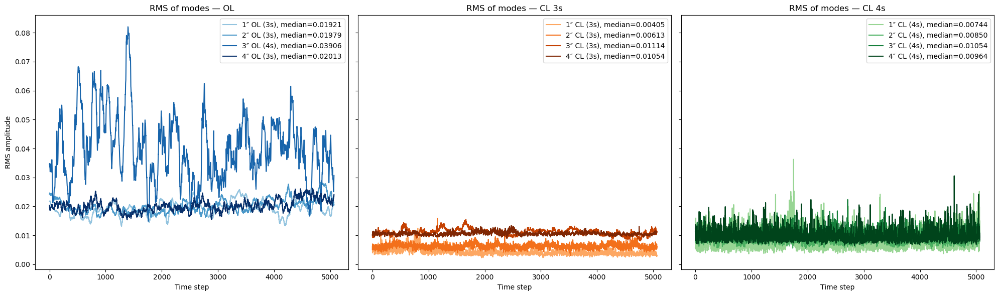

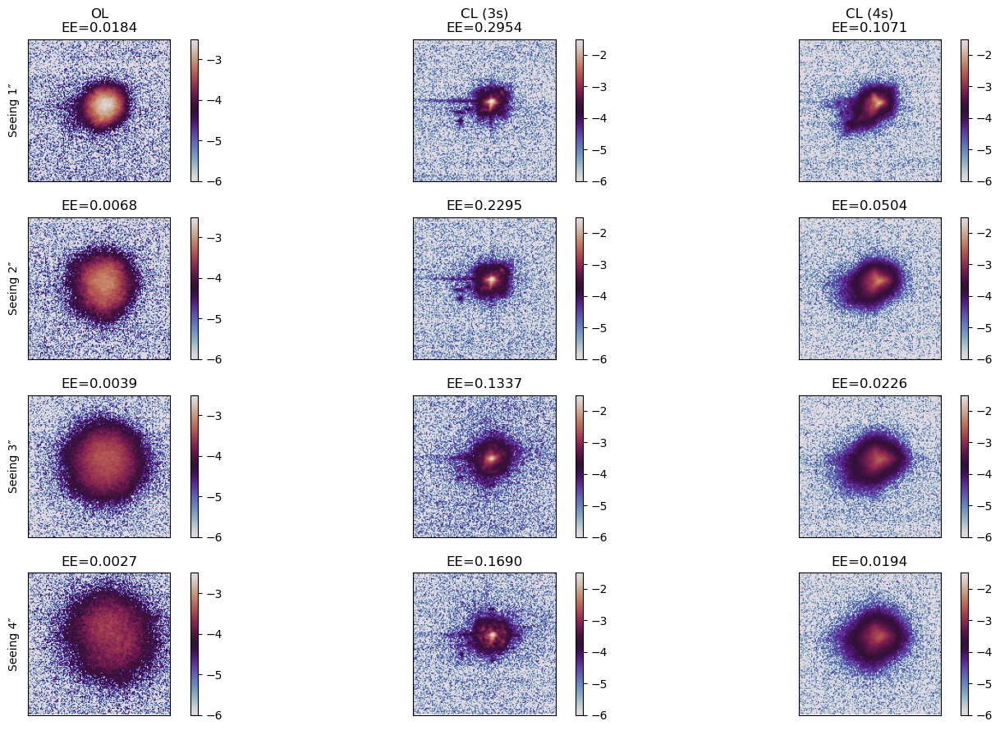

In [67]:
%matplotlib inline
# ---------- Define folders from your addresses ----------
seeing_1arcsec_folder_save_ol_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-16-28/'
seeing_1arcsec_folder_save_cl_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-17-15/'
seeing_1arcsec_folder_save_cl_4s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-18-04/'

seeing_2arcsec_folder_save_ol_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-19-34/'
seeing_2arcsec_folder_save_cl_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-20-26/'
seeing_2arcsec_folder_save_cl_4s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-21-24/'

seeing_3arcsec_folder_save_ol_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-22-21/'
seeing_3arcsec_folder_save_cl_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-24-42/'
seeing_3arcsec_folder_save_cl_4s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-25-39/'

seeing_4arcsec_folder_save_ol_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-27-25/'
seeing_4arcsec_folder_save_cl_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-28-34/'
seeing_4arcsec_folder_save_cl_4s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_18-29-42/'

# ---------- Compute RMS series ----------
# 1"
seeing_1arcsec_rms_modes_ol_3s = compute_modes_rms(seeing_1arcsec_folder_save_ol_3s)
seeing_1arcsec_rms_modes_cl_3s = compute_modes_rms(seeing_1arcsec_folder_save_cl_3s)
seeing_1arcsec_rms_modes_cl_4s = compute_modes_rms(seeing_1arcsec_folder_save_cl_4s)
# 2"
seeing_2arcsec_rms_modes_ol_3s = compute_modes_rms(seeing_2arcsec_folder_save_ol_3s)
seeing_2arcsec_rms_modes_cl_3s = compute_modes_rms(seeing_2arcsec_folder_save_cl_3s)
seeing_2arcsec_rms_modes_cl_4s = compute_modes_rms(seeing_2arcsec_folder_save_cl_4s)
# 3"
seeing_3arcsec_rms_modes_ol_3s = compute_modes_rms(seeing_3arcsec_folder_save_ol_3s)
seeing_3arcsec_rms_modes_cl_3s = compute_modes_rms(seeing_3arcsec_folder_save_cl_3s)
seeing_3arcsec_rms_modes_cl_4s = compute_modes_rms(seeing_3arcsec_folder_save_cl_4s)
# 4"
seeing_4arcsec_rms_modes_ol_3s = compute_modes_rms(seeing_4arcsec_folder_save_ol_3s)
seeing_4arcsec_rms_modes_cl_3s = compute_modes_rms(seeing_4arcsec_folder_save_cl_3s)
seeing_4arcsec_rms_modes_cl_4s = compute_modes_rms(seeing_4arcsec_folder_save_cl_4s)

# ---------- Plotting in subplots ----------
seeings = ["1″", "2″", "3″", "4″"]
ol_types = ["3s", "3s", "4s", "3s"]

shades_ol   = cm.Blues(np.linspace(0.4, 1, len(seeings)))
shades_cl3s = cm.Oranges(np.linspace(0.4, 1, len(seeings)))
shades_cl4s = cm.Greens(np.linspace(0.4, 1, len(seeings)))

fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

# --- OL ---
for i, (data, color) in enumerate(zip(
    [seeing_1arcsec_rms_modes_ol_3s,
     seeing_2arcsec_rms_modes_ol_3s,
     seeing_3arcsec_rms_modes_ol_3s,   # actually 4s pyramid
     seeing_4arcsec_rms_modes_ol_3s], shades_ol)):
    m = np.median(data)
    axes[0].plot(data, color=color,
                 label=f'{seeings[i]} OL ({ol_types[i]}), median={m:.5f}')
axes[0].set_title('RMS of modes — OL')
axes[0].set_xlabel('Time step'); axes[0].set_ylabel('RMS amplitude'); axes[0].legend()

# --- CL 3s ---
for i, (data, color) in enumerate(zip(
    [seeing_1arcsec_rms_modes_cl_3s,
     seeing_2arcsec_rms_modes_cl_3s,
     seeing_3arcsec_rms_modes_cl_3s,
     seeing_4arcsec_rms_modes_cl_3s], shades_cl3s)):
    mean_val = np.median(data)
    axes[1].plot(data, color=color, label=f'{seeings[i]} CL (3s), median={mean_val:.5f}')
axes[1].set_title('RMS of modes — CL 3s')
axes[1].set_xlabel('Time step'); axes[1].legend()

# --- CL 4s ---
for i, (data, color) in enumerate(zip(
    [seeing_1arcsec_rms_modes_cl_4s,
     seeing_2arcsec_rms_modes_cl_4s,
     seeing_3arcsec_rms_modes_cl_4s,
     seeing_4arcsec_rms_modes_cl_4s], shades_cl4s)):
    mean_val = np.median(data)
    axes[2].plot(data, color=color, label=f'{seeings[i]} CL (4s), median={mean_val:.5f}')
axes[2].set_title('RMS of modes — CL 4s')
axes[2].set_xlabel('Time step'); axes[2].legend()

plt.tight_layout()
plt.savefig(os.path.join('AObench/outputs/Calibration_files_papyrus_best',f"Residuals_comparison_1000Hz.png"), dpi=300) 
plt.show()

# ---------- Compute integrated PSF ----------
# 1"
seeing_1arcsec_psf_ol_3s = compute_integrated_psf(seeing_1arcsec_folder_save_ol_3s)
seeing_1arcsec_psf_cl_3s = compute_integrated_psf(seeing_1arcsec_folder_save_cl_3s)
seeing_1arcsec_psf_cl_4s = compute_integrated_psf(seeing_1arcsec_folder_save_cl_4s)

# 2"
seeing_2arcsec_psf_ol_3s = compute_integrated_psf(seeing_2arcsec_folder_save_ol_3s)
seeing_2arcsec_psf_cl_3s = compute_integrated_psf(seeing_2arcsec_folder_save_cl_3s)
seeing_2arcsec_psf_cl_4s = compute_integrated_psf(seeing_2arcsec_folder_save_cl_4s)

# 3"
seeing_3arcsec_psf_ol_3s = compute_integrated_psf(seeing_3arcsec_folder_save_ol_3s)
seeing_3arcsec_psf_cl_3s = compute_integrated_psf(seeing_3arcsec_folder_save_cl_3s)
seeing_3arcsec_psf_cl_4s = compute_integrated_psf(seeing_3arcsec_folder_save_cl_4s)

# 4"
seeing_4arcsec_psf_ol_3s = compute_integrated_psf(seeing_4arcsec_folder_save_ol_3s)
seeing_4arcsec_psf_cl_3s = compute_integrated_psf(seeing_4arcsec_folder_save_cl_3s)
seeing_4arcsec_psf_cl_4s = compute_integrated_psf(seeing_4arcsec_folder_save_cl_4s)

# 4 rows (seeings: 1″→4″) × 3 cols (configs: OL 3s, CL 3s, CL 4s)

psf_grid = [
    [seeing_1arcsec_psf_ol_3s, seeing_1arcsec_psf_cl_3s, seeing_1arcsec_psf_cl_4s],
    [seeing_2arcsec_psf_ol_3s, seeing_2arcsec_psf_cl_3s, seeing_2arcsec_psf_cl_4s],
    [seeing_3arcsec_psf_ol_3s, seeing_3arcsec_psf_cl_3s, seeing_3arcsec_psf_cl_4s],
    [seeing_4arcsec_psf_ol_3s, seeing_4arcsec_psf_cl_3s, seeing_4arcsec_psf_cl_4s],
]

psf_grid_log = [
    [np.log10(np.clip(seeing_1arcsec_psf_ol_3s, 1e-6, None)),
     np.log10(np.clip(seeing_1arcsec_psf_cl_3s, 1e-6, None)),
     np.log10(np.clip(seeing_1arcsec_psf_cl_4s, 1e-6, None))],

    [np.log10(np.clip(seeing_2arcsec_psf_ol_3s, 1e-6, None)),
     np.log10(np.clip(seeing_2arcsec_psf_cl_3s, 1e-6, None)),
     np.log10(np.clip(seeing_2arcsec_psf_cl_4s, 1e-6, None))],

    [np.log10(np.clip(seeing_3arcsec_psf_ol_3s, 1e-6, None)),
     np.log10(np.clip(seeing_3arcsec_psf_cl_3s, 1e-6, None)),
     np.log10(np.clip(seeing_3arcsec_psf_cl_4s, 1e-6, None))],

    [np.log10(np.clip(seeing_4arcsec_psf_ol_3s, 1e-6, None)),
     np.log10(np.clip(seeing_4arcsec_psf_cl_3s, 1e-6, None)),
     np.log10(np.clip(seeing_4arcsec_psf_cl_4s, 1e-6, None))]
]

row_labels = ["Seeing 1″", "Seeing 2″", "Seeing 3″", "Seeing 4″"]
col_labels = ["OL", "CL (3s)", "CL (4s)"]


# ---------- Fixed centers ----------
fixed_centers = {
    "OL":  (82, 83),
    "CL (3s)": (82, 83),
    "CL (4s)": (84, 82),
}

# ---------- Fixed total EE value ----------
EE_TOTAL = 1.22e8  #Total EE in radius of 40 pixels

# ---------- Plot PSFs with fixed centers + Strehl estimation ----------
fig, axes = plt.subplots(4, 3, figsize=(16, 9))

core_radius = 2

for r in range(4):
    for c in range(3):
        psf = psf_grid[r][c]  # linear PSF
        total_flux = psf.sum()
        psf = psf/total_flux # normalize by flux
        psf_disp = np.log10(np.clip(psf, 1e-6, None))  # display only

        # Apply vmax only for CL 3s (col=1) and CL 4s (col=2)
        if c == 1:   # CL 3s
            im = axes[r, c].imshow(psf_disp, origin='lower',
                                   cmap='twilight', aspect='equal', vmax=-1.5, vmin=-6)
        elif c == 2: # CL 4s
            im = axes[r, c].imshow(psf_disp, origin='lower',
                                   cmap='twilight', aspect='equal', vmax=-1.5, vmin=-6)
        else:        # OL (col=0)
            im = axes[r, c].imshow(psf_disp, origin='lower',
                                   cmap='twilight', aspect='equal', vmax=-2.5, vmin=-6)

        # ---- Use fixed center ----
        config = col_labels[c]
        x_c, y_c = fixed_centers[config]

        # ---- Compute encircled energy ----
        #ee_core = encircled_energy(psf, x_c, y_c, radius=core_radius)
        ee_core = encircled_energy_in_3x3(psf, x_c, y_c)

        # ---- Draw aperture circle for core radius ----
        circ = Circle((x_c, y_c), radius=core_radius, color='red',
                      fill=False, lw=1.5, ls='--')
        #axes[r, c].add_patch(circ)

        # Titles and labels (print both EE and Strehl)
        if r == 0:
            axes[r, c].set_title(f"{config}\nEE={ee_core:.4f}")
        else:
            axes[r, c].set_title(f"EE={ee_core:.4f}")

        if c == 0:
            axes[r, c].set_ylabel(row_labels[r])

        axes[r, c].set_xticks([])
        axes[r, c].set_yticks([])

        fig.colorbar(im, ax=axes[r, c], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.savefig(os.path.join('AObench/outputs/Calibration_files_papyrus_best',f"PSFs_comparison_1000Hz.png"), dpi=300) 
plt.show()


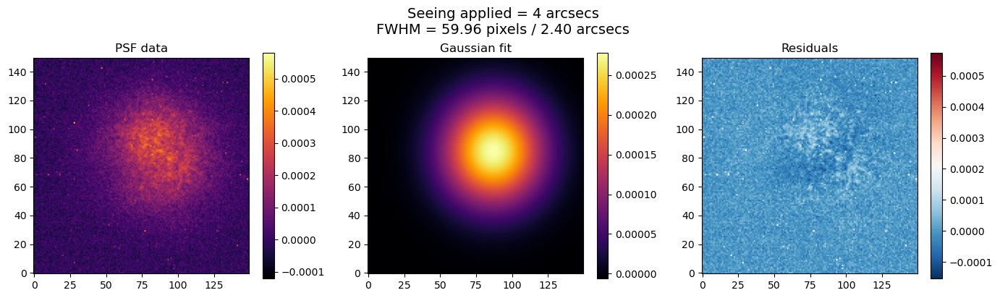

FWHM x: 2.32 arcsec
FWHM y: 2.48 arcsec
FWHM geometric mean: 2.40 arcsec


In [27]:
seeing = 4
psf = seeing_4arcsec_psf_ol_3s/np.sum(seeing_4arcsec_psf_ol_3s)
pixel_scale = 0.04   # arcsec per pixel (example, replace with real value)

# Fit
(fwhm_x, fwhm_y, fwhm_geom), popt, model = fit_fwhm_2d(psf)

# Residuals
residuals = psf - model

# Plot
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
im0 = axes[0].imshow(psf, origin="lower", cmap="inferno")
axes[0].set_title("PSF data"); plt.colorbar(im0, ax=axes[0])

im1 = axes[1].imshow(model, origin="lower", cmap="inferno")
axes[1].set_title("Gaussian fit"); plt.colorbar(im1, ax=axes[1])

im2 = axes[2].imshow(residuals, origin="lower", cmap="RdBu_r")
axes[2].set_title("Residuals"); plt.colorbar(im2, ax=axes[2])

fig.suptitle(
    f"Seeing applied = {seeing} arcsecs\nFWHM = {fwhm_geom:.2f} pixels / {fwhm_geom*pixel_scale:.2f} arcsecs",
    fontsize=14
)

plt.tight_layout()
#plt.savefig(os.path.join('AObench/outputs/Calibration_files_papyrus_best',f"seeing_check_{seeing}arcsecs.png"), dpi=300)
plt.show()

print(f"FWHM x: {fwhm_x*pixel_scale:.2f} arcsec")
print(f"FWHM y: {fwhm_y*pixel_scale:.2f} arcsec")
print(f"FWHM geometric mean: {fwhm_geom*pixel_scale:.2f} arcsec")


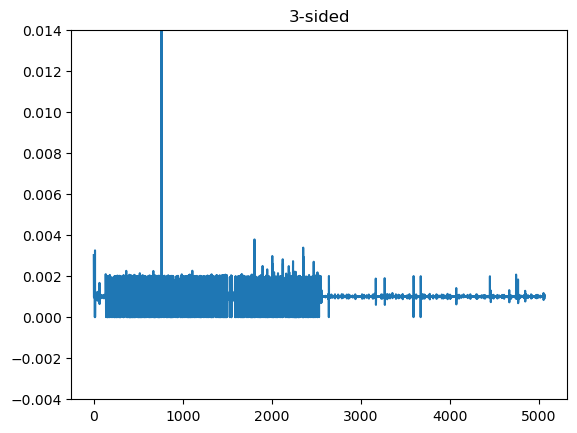

duplicate frames 287
missed frames time [0.002  0.0023 0.0007 0.0011 0.0008 0.001  0.001  0.001  0.001  0.0011
 0.001  0.0009 0.0006 0.001  0.001  0.001  0.001  0.001  0.001  0.001
 0.001  0.001  0.001  0.001  0.001  0.001  0.001  0.0011 0.001  0.0013
 0.001  0.001  0.001  0.0011 0.0009 0.001  0.001  0.001  0.001  0.001
 0.001  0.001  0.0009 0.0008 0.0009 0.0011 0.001  0.001  0.001  0.001
 0.001  0.001  0.001  0.0011 0.0009 0.001  0.001  0.001  0.0008 0.001
 0.001  0.001  0.001  0.001  0.001  0.0007 0.001  0.001  0.001  0.001
 0.001  0.001  0.001  0.0012 0.0009 0.0006 0.001  0.001  0.001  0.001
 0.001  0.001  0.001  0.001  0.001  0.001  0.001  0.013  0.001  0.001
 0.001  0.0008 0.001  0.001  0.001  0.001  0.001  0.001  0.001  0.001
 0.001  0.001  0.001  0.001  0.001  0.0008 0.001  0.001  0.001  0.001
 0.0009 0.001  0.0011 0.001  0.001  0.001  0.001  0.001  0.001  0.0009
 0.001  0.001  0.001  0.0011 0.001  0.001  0.001  0.001  0.0013 0.001
 0.001  0.001  0.001  0.001  0.001  0.001  0.00

In [72]:
timestamps = fits.getdata(os.path.join(
    seeing_4arcsec_folder_save_cl_3s,
    'modes_ts.fits'))


diff = np.diff(np.asarray(timestamps.squeeze()))

plt.figure()
plt.plot(diff)
plt.ylim(-0.004, 0.014)
plt.title('3-sided')
plt.show()


# Duplicate frames → positions where diff == 0
duplicate_indices = np.where(diff == 0)[0]

# Missed frames → positions where diff > 0.0015
missed_indices = np.where(diff > 0.0015)[0]

print("duplicate frames count:", len(duplicate_indices))
print("duplicate frames positions:", duplicate_indices)

print("missed frames time:", np.round(diff[missed_indices], 4) - 0.001)
print("missed frames count:", np.sum(np.round(diff[missed_indices], 4) - 0.001) / 0.001)
print("missed frames positions:", missed_indices)



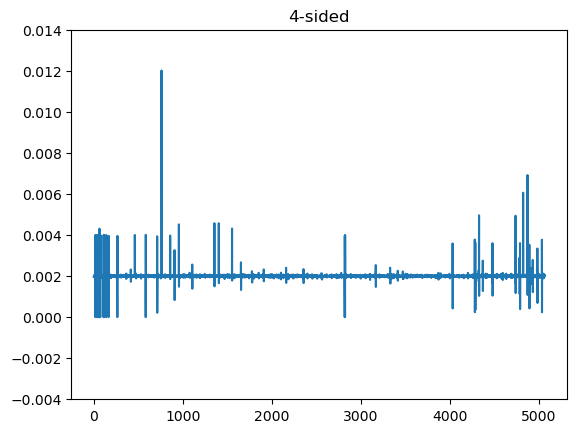

In [29]:
timestamps = fits.getdata(os.path.join(
    seeing_2arcsec_folder_save_cl_4s,
    'modes_ts.fits'))

diff = np.diff(np.asarray(timestamps.squeeze()))
"""
plt.figure()
plt.plot(diff)
plt.ylim(-0.004, 0.014)
plt.title('3-sided')
plt.show()
"""

# Duplicate frames → positions where diff == 0
duplicate_indices = np.where(diff == 0)[0]

# Missed frames → positions where diff > 0.003
missed_indices = np.where(diff > 0.003)[0]

print("duplicate frames count:", len(duplicate_indices))
print("duplicate frames positions:", duplicate_indices)

print("missed frames time:", np.round(diff[missed_indices], 3) - 0.002)
print("missed frames count:", np.sum(np.round(diff[missed_indices], 3) - 0.002) / 0.002)
print("missed frames positions:", missed_indices)

# 500 Hz

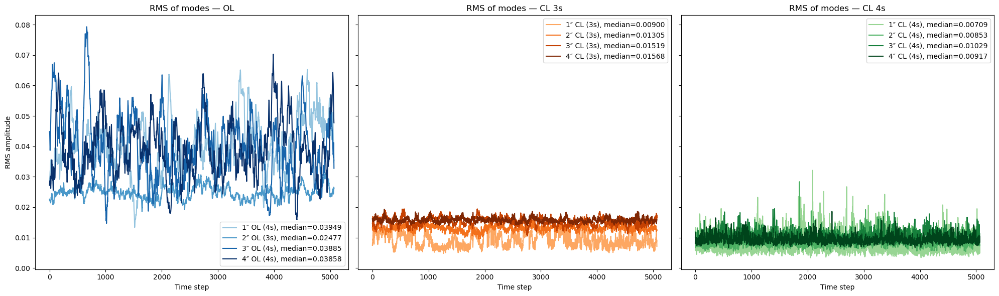

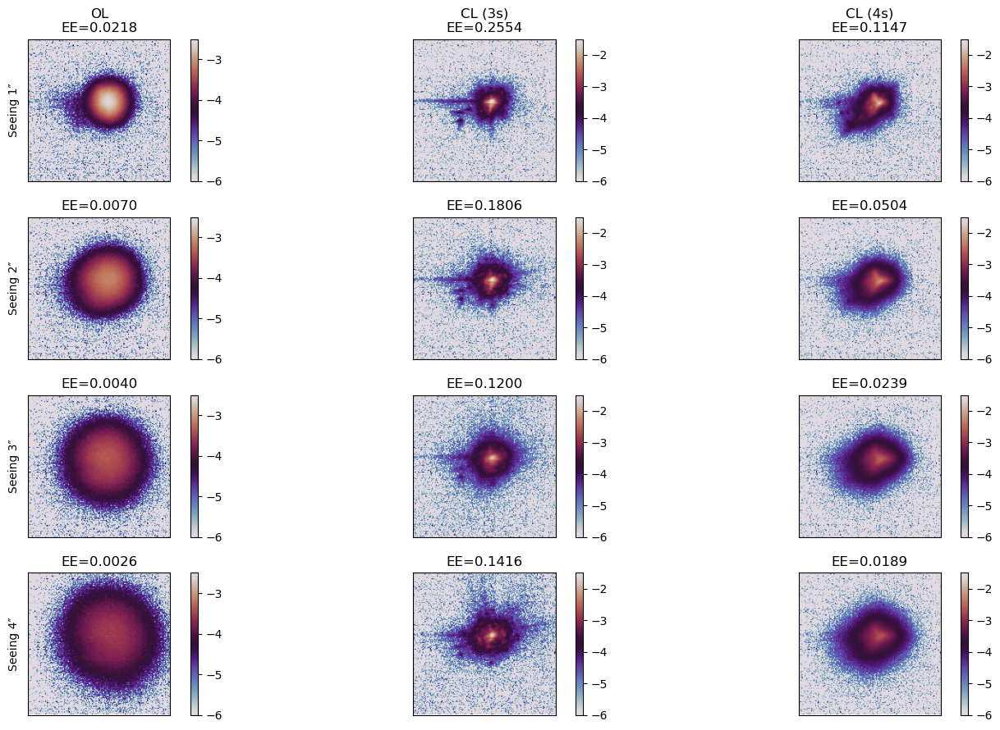

In [78]:
# ---------- Define folders from your addresses ----------
seeing_1arcsec_folder_save_ol_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_17-29-10/'
seeing_1arcsec_folder_save_cl_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_17-30-38/'
seeing_1arcsec_folder_save_cl_4s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_17-31-48/'

seeing_2arcsec_folder_save_ol_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_17-23-34/'
seeing_2arcsec_folder_save_cl_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_17-23-50/'
seeing_2arcsec_folder_save_cl_4s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_17-24-28/'

seeing_3arcsec_folder_save_ol_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_17-34-35/'
seeing_3arcsec_folder_save_cl_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_17-35-49/'
seeing_3arcsec_folder_save_cl_4s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_17-37-30/'

seeing_4arcsec_folder_save_ol_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_17-38-44/'
seeing_4arcsec_folder_save_cl_3s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_17-43-11/'
seeing_4arcsec_folder_save_cl_4s = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-08_17-44-52/'

# ---------- Compute RMS series ----------
# 1"
seeing_1arcsec_rms_modes_ol_3s = compute_modes_rms(seeing_1arcsec_folder_save_ol_3s)
seeing_1arcsec_rms_modes_cl_3s = compute_modes_rms(seeing_1arcsec_folder_save_cl_3s)
seeing_1arcsec_rms_modes_cl_4s = compute_modes_rms(seeing_1arcsec_folder_save_cl_4s)
# 2"
seeing_2arcsec_rms_modes_ol_3s = compute_modes_rms(seeing_2arcsec_folder_save_ol_3s)
seeing_2arcsec_rms_modes_cl_3s = compute_modes_rms(seeing_2arcsec_folder_save_cl_3s)
seeing_2arcsec_rms_modes_cl_4s = compute_modes_rms(seeing_2arcsec_folder_save_cl_4s)
# 3"
seeing_3arcsec_rms_modes_ol_3s = compute_modes_rms(seeing_3arcsec_folder_save_ol_3s)
seeing_3arcsec_rms_modes_cl_3s = compute_modes_rms(seeing_3arcsec_folder_save_cl_3s)
seeing_3arcsec_rms_modes_cl_4s = compute_modes_rms(seeing_3arcsec_folder_save_cl_4s)
# 4"
seeing_4arcsec_rms_modes_ol_3s = compute_modes_rms(seeing_4arcsec_folder_save_ol_3s)
seeing_4arcsec_rms_modes_cl_3s = compute_modes_rms(seeing_4arcsec_folder_save_cl_3s)
seeing_4arcsec_rms_modes_cl_4s = compute_modes_rms(seeing_4arcsec_folder_save_cl_4s)

# ---------- Plotting in subplots ----------
seeings = ["1″", "2″", "3″", "4″"]
ol_types = ["4s", "3s", "4s", "4s"]

shades_ol   = cm.Blues(np.linspace(0.4, 1, len(seeings)))
shades_cl3s = cm.Oranges(np.linspace(0.4, 1, len(seeings)))
shades_cl4s = cm.Greens(np.linspace(0.4, 1, len(seeings)))

fig, axes = plt.subplots(1, 3, figsize=(20, 6), sharey=True)

# --- OL ---
for i, (data, color) in enumerate(zip(
    [seeing_1arcsec_rms_modes_ol_3s,
     seeing_2arcsec_rms_modes_ol_3s,
     seeing_3arcsec_rms_modes_ol_3s,   # actually 4s pyramid
     seeing_4arcsec_rms_modes_ol_3s], shades_ol)):
    m = np.median(data)
    axes[0].plot(data, color=color,
                 label=f'{seeings[i]} OL ({ol_types[i]}), median={m:.5f}')
axes[0].set_title('RMS of modes — OL')
axes[0].set_xlabel('Time step'); axes[0].set_ylabel('RMS amplitude'); axes[0].legend()

# --- CL 3s ---
for i, (data, color) in enumerate(zip(
    [seeing_1arcsec_rms_modes_cl_3s,
     seeing_2arcsec_rms_modes_cl_3s,
     seeing_3arcsec_rms_modes_cl_3s,
     seeing_4arcsec_rms_modes_cl_3s], shades_cl3s)):
    mean_val = np.median(data)
    axes[1].plot(data, color=color, label=f'{seeings[i]} CL (3s), median={mean_val:.5f}')
axes[1].set_title('RMS of modes — CL 3s')
axes[1].set_xlabel('Time step'); axes[1].legend()

# --- CL 4s ---
for i, (data, color) in enumerate(zip(
    [seeing_1arcsec_rms_modes_cl_4s,
     seeing_2arcsec_rms_modes_cl_4s,
     seeing_3arcsec_rms_modes_cl_4s,
     seeing_4arcsec_rms_modes_cl_4s], shades_cl4s)):
    mean_val = np.median(data)
    axes[2].plot(data, color=color, label=f'{seeings[i]} CL (4s), median={mean_val:.5f}')
axes[2].set_title('RMS of modes — CL 4s')
axes[2].set_xlabel('Time step'); axes[2].legend()

plt.tight_layout()
plt.savefig(os.path.join('AObench/outputs/Calibration_files_papyrus_best',f"Residuals_comparison_500Hz.png"), dpi=300) 
plt.show()

# ---------- Compute integrated PSF ----------
# 1"
seeing_1arcsec_psf_ol_3s = compute_integrated_psf(seeing_1arcsec_folder_save_ol_3s)
seeing_1arcsec_psf_cl_3s = compute_integrated_psf(seeing_1arcsec_folder_save_cl_3s)
seeing_1arcsec_psf_cl_4s = compute_integrated_psf(seeing_1arcsec_folder_save_cl_4s)

# 2"
seeing_2arcsec_psf_ol_3s = compute_integrated_psf(seeing_2arcsec_folder_save_ol_3s)
seeing_2arcsec_psf_cl_3s = compute_integrated_psf(seeing_2arcsec_folder_save_cl_3s)
seeing_2arcsec_psf_cl_4s = compute_integrated_psf(seeing_2arcsec_folder_save_cl_4s)

# 3"
seeing_3arcsec_psf_ol_3s = compute_integrated_psf(seeing_3arcsec_folder_save_ol_3s)
seeing_3arcsec_psf_cl_3s = compute_integrated_psf(seeing_3arcsec_folder_save_cl_3s)
seeing_3arcsec_psf_cl_4s = compute_integrated_psf(seeing_3arcsec_folder_save_cl_4s)

# 4"
seeing_4arcsec_psf_ol_3s = compute_integrated_psf(seeing_4arcsec_folder_save_ol_3s)
seeing_4arcsec_psf_cl_3s = compute_integrated_psf(seeing_4arcsec_folder_save_cl_3s)
seeing_4arcsec_psf_cl_4s = compute_integrated_psf(seeing_4arcsec_folder_save_cl_4s)

# 4 rows (seeings: 1″→4″) × 3 cols (configs: OL 3s, CL 3s, CL 4s)

psf_grid = [
    [seeing_1arcsec_psf_ol_3s, seeing_1arcsec_psf_cl_3s, seeing_1arcsec_psf_cl_4s],
    [seeing_2arcsec_psf_ol_3s, seeing_2arcsec_psf_cl_3s, seeing_2arcsec_psf_cl_4s],
    [seeing_3arcsec_psf_ol_3s, seeing_3arcsec_psf_cl_3s, seeing_3arcsec_psf_cl_4s],
    [seeing_4arcsec_psf_ol_3s, seeing_4arcsec_psf_cl_3s, seeing_4arcsec_psf_cl_4s],
]

psf_grid_log = [
    [np.log10(np.clip(seeing_1arcsec_psf_ol_3s, 1e-6, None)),
     np.log10(np.clip(seeing_1arcsec_psf_cl_3s, 1e-6, None)),
     np.log10(np.clip(seeing_1arcsec_psf_cl_4s, 1e-6, None))],

    [np.log10(np.clip(seeing_2arcsec_psf_ol_3s, 1e-6, None)),
     np.log10(np.clip(seeing_2arcsec_psf_cl_3s, 1e-6, None)),
     np.log10(np.clip(seeing_2arcsec_psf_cl_4s, 1e-6, None))],

    [np.log10(np.clip(seeing_3arcsec_psf_ol_3s, 1e-6, None)),
     np.log10(np.clip(seeing_3arcsec_psf_cl_3s, 1e-6, None)),
     np.log10(np.clip(seeing_3arcsec_psf_cl_4s, 1e-6, None))],

    [np.log10(np.clip(seeing_4arcsec_psf_ol_3s, 1e-6, None)),
     np.log10(np.clip(seeing_4arcsec_psf_cl_3s, 1e-6, None)),
     np.log10(np.clip(seeing_4arcsec_psf_cl_4s, 1e-6, None))]
]

row_labels = ["Seeing 1″", "Seeing 2″", "Seeing 3″", "Seeing 4″"]
col_labels = ["OL", "CL (3s)", "CL (4s)"]


# ---------- Fixed centers ----------
fixed_centers = {
    "OL":  (82, 83),
    "CL (3s)": (82, 83),
    "CL (4s)": (84, 82),
}

# ---------- Fixed total EE value ----------
EE_TOTAL = 1.22e8  #Total EE in radius of 40 pixels

# ---------- Plot PSFs with fixed centers + Strehl estimation ----------
fig, axes = plt.subplots(4, 3, figsize=(16, 9))

core_radius = 2

for r in range(4):
    for c in range(3):
        psf = psf_grid[r][c]  # linear PSF
        total_flux = psf.sum()
        psf = psf/total_flux # normalize by flux
        psf_disp = np.log10(np.clip(psf, 1e-6, None))  # display only

        # Apply vmax only for CL 3s (col=1) and CL 4s (col=2)
        if c == 1:   # CL 3s
            im = axes[r, c].imshow(psf_disp, origin='lower',
                                   cmap='twilight', aspect='equal', vmax=-1.5, vmin=-6)
        elif c == 2: # CL 4s
            im = axes[r, c].imshow(psf_disp, origin='lower',
                                   cmap='twilight', aspect='equal', vmax=-1.5, vmin=-6)
        else:        # OL (col=0)
            im = axes[r, c].imshow(psf_disp, origin='lower',
                                   cmap='twilight', aspect='equal', vmax=-2.5, vmin=-6)

        # ---- Use fixed center ----
        config = col_labels[c]
        x_c, y_c = fixed_centers[config]

        # ---- Compute encircled energy ----
        #ee_core = encircled_energy(psf, x_c, y_c, radius=core_radius)
        ee_core = encircled_energy_in_3x3(psf, x_c, y_c)

        # ---- Draw aperture circle for core radius ----
        circ = Circle((x_c, y_c), radius=core_radius, color='red',
                      fill=False, lw=1.5, ls='--')
        #axes[r, c].add_patch(circ)

        # Titles and labels (print both EE and Strehl)
        if r == 0:
            axes[r, c].set_title(f"{config}\nEE={ee_core:.4f}")
        else:
            axes[r, c].set_title(f"EE={ee_core:.4f}")

        if c == 0:
            axes[r, c].set_ylabel(row_labels[r])

        axes[r, c].set_xticks([])
        axes[r, c].set_yticks([])

        fig.colorbar(im, ax=axes[r, c], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.savefig(os.path.join('AObench/outputs/Calibration_files_papyrus_best',f"PSFs_comparison_500Hz.png"), dpi=300) 
plt.show()


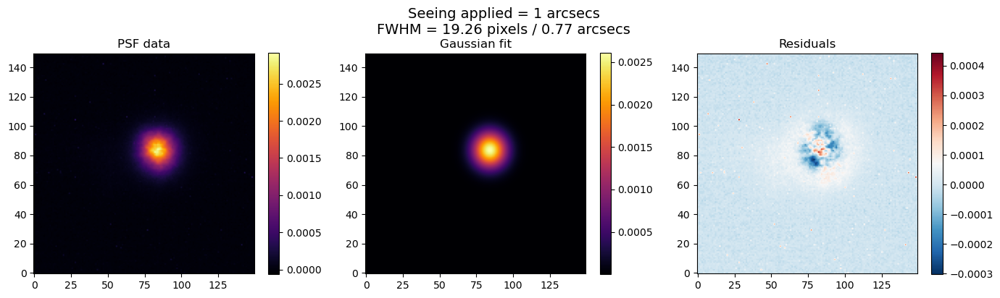

FWHM x: 0.75 arcsec
FWHM y: 0.79 arcsec
FWHM geometric mean: 0.77 arcsec


In [31]:
seeing = 1
psf = seeing_1arcsec_psf_ol_3s/np.sum(seeing_4arcsec_psf_ol_3s)
pixel_scale = 0.04   # arcsec per pixel (example, replace with real value)

# Fit
(fwhm_x, fwhm_y, fwhm_geom), popt, model = fit_fwhm_2d(psf)

# Residuals
residuals = psf - model

# Plot
fig, axes = plt.subplots(1, 3, figsize=(14, 4))
im0 = axes[0].imshow(psf, origin="lower", cmap="inferno")
axes[0].set_title("PSF data"); plt.colorbar(im0, ax=axes[0])

im1 = axes[1].imshow(model, origin="lower", cmap="inferno")
axes[1].set_title("Gaussian fit"); plt.colorbar(im1, ax=axes[1])

im2 = axes[2].imshow(residuals, origin="lower", cmap="RdBu_r")
axes[2].set_title("Residuals"); plt.colorbar(im2, ax=axes[2])

fig.suptitle(
    f"Seeing applied = {seeing} arcsecs\nFWHM = {fwhm_geom:.2f} pixels / {fwhm_geom*pixel_scale:.2f} arcsecs",
    fontsize=14
)

plt.tight_layout()
#plt.savefig(os.path.join('AObench/outputs/Calibration_files_papyrus_best',f"seeing_check_{seeing}arcsecs.png"), dpi=300)
plt.show()

print(f"FWHM x: {fwhm_x*pixel_scale:.2f} arcsec")
print(f"FWHM y: {fwhm_y*pixel_scale:.2f} arcsec")
print(f"FWHM geometric mean: {fwhm_geom*pixel_scale:.2f} arcsec")


In [79]:
%matplotlib qt
timestamps = fits.getdata(os.path.join(
    seeing_4arcsec_folder_save_cl_3s,
    'modes_ts.fits'))


diff = np.diff(np.asarray(timestamps.squeeze()))
"""
plt.figure()
plt.plot(diff)
plt.ylim(-0.004, 0.014)
plt.title('3-sided')
plt.show()
"""

# Duplicate frames → positions where diff == 0
duplicate_indices = np.where(diff == 0)[0]

# Missed frames → positions where diff > 0.003
missed_indices = np.where(diff > 0.003)[0]

print("duplicate frames count:", len(duplicate_indices))
print("duplicate frames positions:", duplicate_indices)

print("missed frames time:", np.round(diff[missed_indices], 3) - 0.002)
print("missed frames count:", np.sum(np.round(diff[missed_indices], 3) - 0.002) / 0.002)
print("missed frames positions:", missed_indices)

duplicate frames count: 98
duplicate frames positions: [   1   48   56   59   65   68   87   90   97  104  106  108  110  121
  125  128  136  139  141  145  147  152  156  160  162  164  172  179
  183  188  191  193  198  202  207  211  218  228  232  235  238  242
  253  258  260  263  265  273  275  279  282  285  287  291  326  330
  341  345  349  369  371  377  390  392  397  669  762  834  845  850
  852  864  870  878  884 1014 1029 1062 1118 1149 1151 1153 1161 1165
 1182 1193 2187 2261 2264 2268 2310 2314 2763 4148 4156 4168 4170 4172]
missed frames time: [0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002
 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002
 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002
 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002
 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002
 0.002 0.002 0.002 0.002 0.002 0.002 0.014 0.002 0.001 0.002 0

In [66]:
timestamps = fits.getdata(os.path.join(
    seeing_4arcsec_folder_save_cl_4s,
    'modes_ts.fits'))

diff = np.diff(np.asarray(timestamps.squeeze()))
"""
plt.figure()
plt.plot(diff)
plt.ylim(-0.004, 0.014)
plt.title('3-sided')
plt.show()
"""

# Duplicate frames → positions where diff == 0
duplicate_indices = np.where(diff == 0)[0]

# Missed frames → positions where diff > 0.003
missed_indices = np.where(diff > 0.003)[0]

print("duplicate frames count:", len(duplicate_indices))
print("duplicate frames positions:", duplicate_indices)

print("missed frames time:", np.round(diff[missed_indices], 3) - 0.002)
print("missed frames count:", np.sum(np.round(diff[missed_indices], 3) - 0.002) / 0.002)
print("missed frames positions:", missed_indices)

duplicate frames 17
missed frames time [0.004 0.002 0.001 0.009 0.001 0.002 0.001 0.002 0.002 0.014 0.002 0.002
 0.001 0.003 0.002 0.002 0.002 0.002 0.002 0.002 0.004 0.002 0.001 0.001
 0.001 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.002 0.004
 0.002 0.002 0.002 0.002]
missed frames 49.50000000000001


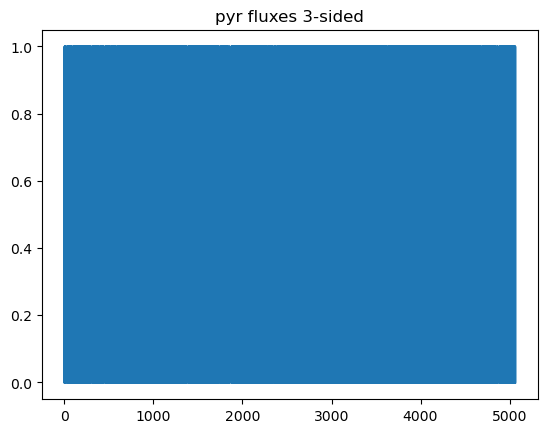

1397


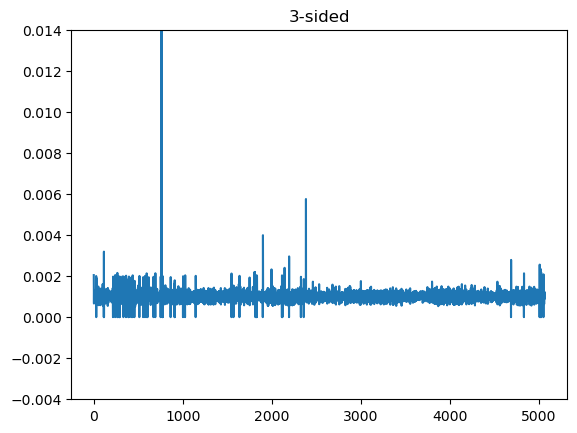

duplicate frames 50
missed frames time [0.001  0.0006 0.001  0.0009 0.0006 0.0022 0.001  0.001  0.0012 0.001
 0.0009 0.001  0.001  0.0008 0.001  0.001  0.0009 0.001  0.0009 0.001
 0.0008 0.0005 0.001  0.001  0.001  0.0011 0.0011 0.001  0.0009 0.0009
 0.001  0.0005 0.0011 0.001  0.0162 0.0009 0.001  0.0005 0.0006 0.001
 0.0006 0.0008 0.0007 0.0005 0.001  0.001  0.001  0.0011 0.0005 0.0005
 0.0006 0.001  0.0009 0.0012 0.0011 0.0012 0.0009 0.001  0.001  0.003
 0.0013 0.0006 0.0005 0.0005 0.001  0.001  0.0005 0.0014 0.002  0.001
 0.0009 0.0048 0.0007 0.0006 0.0006 0.0005 0.0005 0.0008 0.0007 0.0005
 0.0005 0.0006 0.0005 0.0006 0.0005 0.0007 0.0005 0.0018 0.0011 0.0016
 0.0013 0.0012 0.0011]
missed frames 105.10000000000001


In [81]:
%matplotlib inline

pyr_fluxes = fits.getdata(os.path.join('/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-09_01-20-04', 'pyr_fluxes.fits'))

plt.figure()
plot_fluxes = pyr_fluxes.squeeze()
plt.plot(np.abs(np.diff(plot_fluxes/np.mean(plot_fluxes)))==0)
#plt.xscale('log')
plt.title('pyr fluxes 3-sided')
plt.show()

print(np.sum(np.diff(plot_fluxes/np.mean(plot_fluxes))==0))

timestamps = fits.getdata(os.path.join(
    '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-09_01-20-04',
    'modes_ts.fits'))


diff = np.diff(np.asarray(timestamps.squeeze()))

plt.figure()
plt.plot(diff)
plt.ylim(-0.004, 0.014)
plt.title('3-sided')
plt.show()

print('duplicate frames', np.sum(diff==0))
print("missed frames time", np.round(diff[diff > 0.0015],4)-0.001)
print("missed frames", np.sum(np.round(diff[diff > 0.0015], 4)-0.001)/0.001)


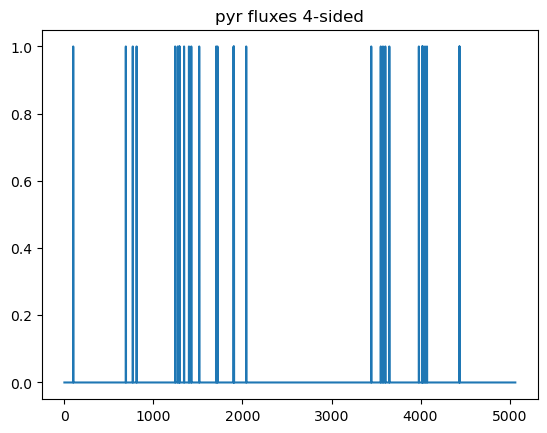

30


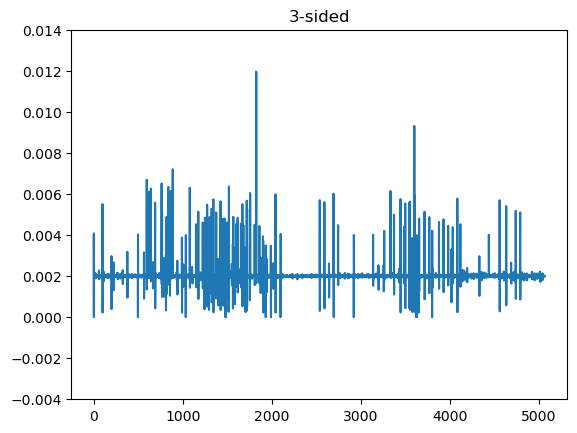

duplicate frames 13
missed frames time [0.002 0.002 0.004 0.001 0.002 0.001 0.005 0.004 0.004 0.004 0.002 0.005
 0.003 0.001 0.003 0.004 0.004 0.005 0.002 0.002 0.004 0.003 0.003 0.003
 0.002 0.003 0.003 0.002 0.002 0.003 0.003 0.003 0.004 0.003 0.004 0.003
 0.001 0.003 0.002 0.002 0.003 0.001 0.003 0.001 0.004 0.002 0.003 0.001
 0.001 0.003 0.003 0.003 0.003 0.002 0.001 0.004 0.001 0.003 0.004 0.003
 0.002 0.01  0.002 0.002 0.002 0.001 0.001 0.004 0.002 0.004 0.004 0.004
 0.002 0.002 0.002 0.002 0.002 0.004 0.003 0.004 0.002 0.004 0.004 0.004
 0.002 0.007 0.004 0.002 0.002 0.002 0.003 0.003 0.003 0.002 0.003 0.003
 0.002 0.001 0.002 0.004 0.003 0.002 0.004 0.003 0.003 0.003]
missed frames 150.50000000000003


In [77]:
pyr_fluxes = fits.getdata(os.path.join('/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-09_01-20-15', 'pyr_fluxes.fits'))

plt.figure()
plot_fluxes = pyr_fluxes.squeeze()
plt.plot(np.abs(np.diff(plot_fluxes/np.mean(plot_fluxes)))==0)
#plt.xscale('log')
plt.title('pyr fluxes 4-sided')
plt.show()

print(np.sum(np.diff(plot_fluxes/np.mean(plot_fluxes))==0))


timestamps = fits.getdata(os.path.join(
    '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-09_01-20-15',
    'modes_ts.fits'))


diff = np.diff(np.asarray(timestamps.squeeze()))

plt.figure()
plt.plot(diff)
plt.ylim(-0.004, 0.014)
plt.title('3-sided')
plt.show()

print('duplicate frames', np.sum(diff==0))
print("missed frames time", np.round(diff[diff > 0.003], 3)-0.002)
print("missed frames", np.sum(np.round(diff[diff > 0.003], 3)-0.002)/0.002)


In [37]:
plt.close('all')

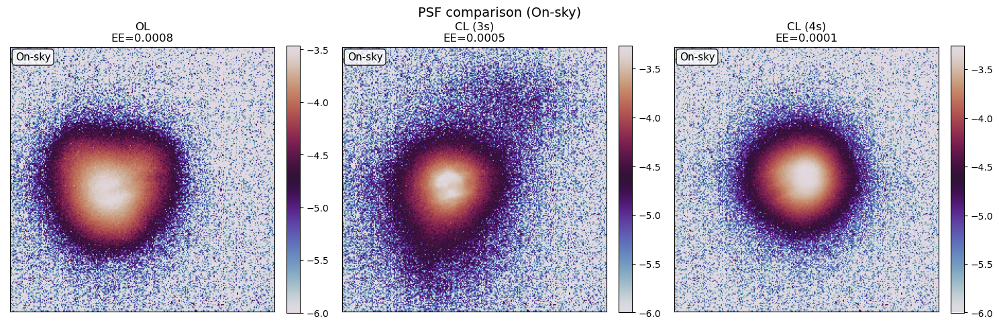

In [88]:
folder_save_ol_3s_onsky = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-09_01-20-04/'
folder_save_cl_3s_onsky = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-09_01-19-54/'
folder_save_cl_4s_onsky = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-09_01-20-15/'

psf_ol   = compute_integrated_psf(folder_save_ol_3s_onsky)
psf_cl3s = compute_integrated_psf(folder_save_cl_3s_onsky)
psf_cl4s = compute_integrated_psf(folder_save_cl_4s_onsky)

psf_grid = [psf_ol, psf_cl3s, psf_cl4s]
col_labels = ["OL", "CL (3s)", "CL (4s)"]

# Fixed centers
fixed_centers = {
    "OL":  (82, 83),
    "CL (3s)": (82, 83),
    "CL (4s)": (84, 82),
}

# ---------- Plot PSFs ----------
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
core_radius = 2

for c in range(3):
    psf = psf_grid[c]
    total_flux = psf.sum()
    psf = psf / total_flux
    psf_disp = np.log10(np.clip(psf, 1e-6, None))

    # Colormap scaling
    if c == 0:   # OL
        im = axes[c].imshow(psf_disp, origin='lower',
                            cmap='twilight', aspect='equal', vmin=-6)
    else:        # CL
        im = axes[c].imshow(psf_disp, origin='lower',
                            cmap='twilight', aspect='equal', vmin=-6)

    config = col_labels[c]
    x_c, y_c = fixed_centers[config]

    # Compute EE
    ee_core = encircled_energy_in_3x3(psf, x_c, y_c)

    # Title = config + EE
    axes[c].set_title(f"{config}\nEE={ee_core:.4f}")
    axes[c].set_xticks([]); axes[c].set_yticks([])

    # Colorbar
    fig.colorbar(im, ax=axes[c], fraction=0.046, pad=0.04)

    # Add "On-sky" label inside each subplot
    badge = dict(boxstyle="round,pad=0.3", fc="white", alpha=0.8, ec="black", lw=1)
    axes[c].text(0.02, 0.98, "On-sky", transform=axes[c].transAxes,
                 va="top", ha="left", fontsize=11, bbox=badge)

# Optional global title
fig.suptitle("PSF comparison (On-sky)", fontsize=14)

plt.tight_layout()
outdir = 'AObench/outputs/Calibration_files_papyrus_best'
plt.savefig(os.path.join(outdir, "PSFs_comparison_on-sky.png"), dpi=300)
plt.show()


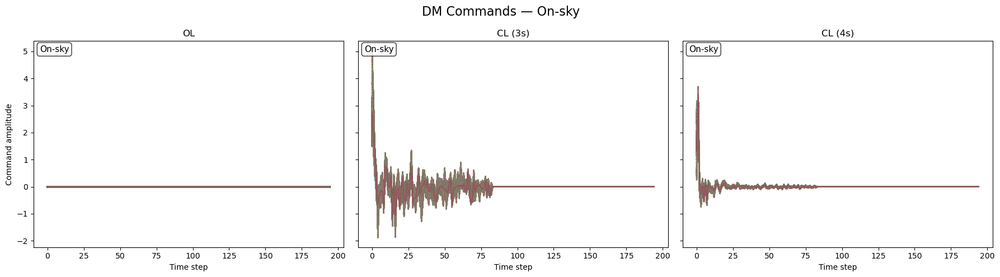

In [87]:
import os
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits

# ---------- Define folders ----------
folder_save_ol_3s_onsky = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-09_01-20-04/'
folder_save_cl_3s_onsky = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-09_01-19-54/'
folder_save_cl_4s_onsky = '/Volumes/UNIGE/RISTRETTO/PAPYTUS_tests_results/AObench/src/record/2025-08-09_01-20-15/'

folders = [folder_save_ol_3s_onsky, folder_save_cl_3s_onsky, folder_save_cl_4s_onsky]
labels  = ["OL", "CL (3s)", "CL (4s)"]

# ---------- Load commands.fits ----------
data_list = []
for f in folders:
    filepath = os.path.join(f, "commands.fits")
    with fits.open(filepath) as hdul:
        data = hdul[0].data
        data_list.append(data)

# ---------- Plot ----------
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

for i, (data, label) in enumerate(zip(data_list, labels)):
    axes[i].plot(data.T, alpha=0.7)   # transpose so actuators are rows
    axes[i].set_title(label)
    axes[i].set_xlabel("Time step")
    if i == 0:
        axes[i].set_ylabel("Command amplitude")

    # Add on-sky tag
    badge = dict(boxstyle="round,pad=0.3", fc="white", alpha=0.8, ec="black", lw=1)
    axes[i].text(0.02, 0.98, "On-sky", transform=axes[i].transAxes,
                 va="top", ha="left", fontsize=11, bbox=badge)

fig.suptitle("DM Commands — On-sky", fontsize=16)

plt.tight_layout()
outdir = "AObench/outputs/Calibration_files_papyrus_best"
os.makedirs(outdir, exist_ok=True)
plt.savefig(os.path.join(outdir, "DM_commands_on-sky.png"), dpi=300)
plt.show()
